<a href="https://colab.research.google.com/github/siddhantjain07/DeepLearning/blob/master/ScalarBackpropagation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Setup


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, mean_squared_error, log_loss
from tqdm.notebook import tqdm
import seaborn as sns
import imageio
from IPython.display import HTML

from sklearn.preprocessing import OneHotEncoder
from sklearn.datasets import make_blobs

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
my_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["red", "yellow", "green"])

In [ ]:
np.random.seed(0)

#Data generation

In [ ]:
data, labels = make_blobs(n_samples=1000, centers=4, n_features=2, random_state=0)
print(data.shape, labels.shape)

(1000, 2) (1000,)


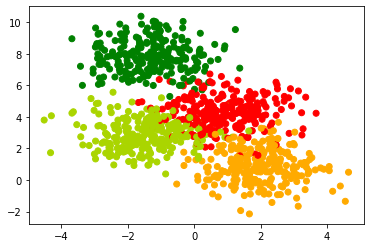

In [ ]:
plt.scatter(data[:,0], data[:,1], c=labels, cmap=my_cmap)
plt.show()

In [ ]:
labels_orig = labels
labels = np.mod(labels_orig, 2)

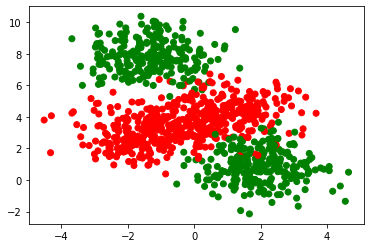

In [ ]:
plt.scatter(data[:,0], data[:,1], c=labels, cmap=my_cmap)
plt.show()

In [ ]:
X_train, X_val, Y_train, Y_val = train_test_split(data, labels, stratify=labels, random_state=0)
print(X_train.shape, X_val.shape)

(750, 2) (250, 2)


#FF Network 

In [ ]:
class FFNetworkW1: 

  def __init__(self):
    self.w1 = np.random.randn()
    self.w2 = np.random.randn()
    self.w3 = np.random.randn()
    self.w4 = np.random.randn()
    self.w5 = np.random.randn()
    self.w6 = np.random.randn()
    self.b1 = 0
    self.b2 = 0
    self.b3 = 0

  def sigmoid(self, x):
    return 1.0/(1.0 + np.exp(-x))

  def forward_pass(self, x):
    self.x1, self.x2 = x
    self.z1 = self.w1*self.x1 + self.w2*self.x2 + self.b1
    self.a1 = self.sigmoid(self.z1)
    self.z2 = self.w3*self.x1 + self.w4*self.x2 + self.b2
    self.a2 = self.sigmoid(self.z2)
    self.z3 = self.w5*self.a1 + self.w6*self.a2 + self.b3
    self.a3 = self.sigmoid(self.z3)
    return self.a3

  def grad(self, x, y):
    self.forward_pass(x)
    self.dw1 = (self.a3-y) * self.a3*(1-self.b3) * self.w5 * self.a1*(1-self.a1)*self.x1

  def fit(self, X, Y, epochs=1, learning_rate=1, display_loss=False):
    if display_loss:
      loss = {}
      w1 = {}
    
    for i in tqdm(range(epochs), total=epochs, unit="epoch"):
      dw1, dw2, dw3, dw4, dw5, dw6, db1, db2, db3 = [0]*9
      for x, y in zip(X, Y):
        self.grad(x, y)
        dw1 += self.dw1

      m = X.shape[0]
      self.w1 -= learning_rate * dw1 / m
      
      if display_loss:
        w1[i] = self.w1
        Y_pred = self.predict(X)
        loss[i] = mean_squared_error(Y_pred, Y)
        
    
    if display_loss:
      plt.tight_layout()
      
      plt.subplot(2,1,1)
      plt.plot(list(w1.values()))
      plt.xlabel('Epochs')
      plt.ylabel('W1')
      
      plt.subplot(2,1,2)
      plt.plot(list(loss.values()))
      plt.xlabel('Epochs')
      plt.ylabel('Mean Squared Error')
      
      plt.show()
      
  def predict(self, X):
    Y_pred = []
    for x in X:
      y_pred = self.forward_pass(x)
      Y_pred.append(y_pred)
    return np.array(Y_pred)

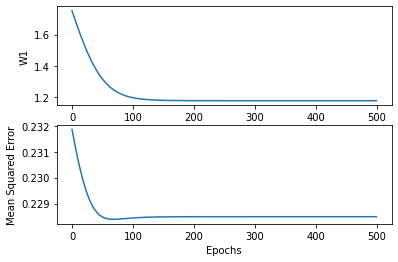

In [ ]:
ffnw1 = FFNetworkW1()
ffnw1.fit(X_train, Y_train, epochs=500, learning_rate=1, display_loss=True)

In [ ]:
class FirstFFNetwork :

  def __init__(self):
    self.w1 = np.random.randn()
    self.w2 = np.random.randn()
    self.w3 = np.random.randn()
    self.w4 = np.random.randn()
    self.w5 = np.random.randn()
    self.w6 = np.random.randn()
    self.b1 = 0
    self.b2 = 0 
    self.b3 = 0

  def sigmoid(self, x):
    return 1.0/(1.0 + np.exp(-x))

  def forward_pass(self, x):
    self.x1, self.x2 = x
    self.z1 = self.w1*self.x1 + self.w2*self.x2 + self.b1
    self.a1 = self.sigmoid(self.z1)
    self.z2 = self.w3*self.x1 + self.w4*self.x2 + self.b2
    self.a2 = self.sigmoid(self.z2)
    self.z3 = self.w5*self.a1 + self.w6*self.a2 + self.b3
    self.a3 = self.sigmoid(self.z3)
    return self.a3    

  def grad(self, x, y):
    self.forward_pass(x)
    self.dw5 = (self.a3-y) * self.a3*(1-self.a3) * self.a1
    self.dw6 = (self.a3-y) * self.a3*(1-self.a3) * self.a2
    self.db3 = (self.a3-y) * self.a3*(1-self.a3)

    self.dw1 = (self.a3-y) * self.a3*(1-self.a3) * self.w5 * self.a1*(1-self.a1) * self.x1
    self.dw2 = (self.a3-y) * self.a3*(1-self.a3) * self.w5 * self.a1*(1-self.a1) * self.x2
    self.db1 = (self.a3-y) * self.a3*(1-self.a3) * self.w5 * self.a1*(1-self.a1)

    self.dw3 = (self.a3-y) * self.a3*(1-self.a3) * self.w6 * self.a2*(1-self.a2) * self.x1
    self.dw4 = (self.a3-y) * self.a3*(1-self.a3) * self.w6 * self.a2*(1-self.a2) * self.x2
    self.db2 = (self.a3-y) * self.a3*(1-self.a3) * self.w6 * self.a2*(1-self.a2)

  def fit(self, X, Y, epochs=1, learning_rate=1, initialise=True, display_loss=False, display_weight=False):
    
    # initialise w, b
    if initialise:
      np.random.seed(0)
      self.w1 = np.random.randn()
      self.w2 = np.random.randn()
      self.w3 = np.random.randn()
      self.w4 = np.random.randn()
      self.w5 = np.random.randn()
      self.w6 = np.random.randn()
      self.b1 = 0
      self.b2 = 0
      self.b3 = 0
      
    if display_loss:
      loss = {}
    
    for i in tqdm(range(epochs), total=epochs, unit="epoch"):
      dw1, dw2, dw3, dw4, dw5, dw6, db1, db2, db3 = [0]*9
      for x, y in zip(X, Y):
        self.grad(x, y)
        dw1 += self.dw1
        dw2 += self.dw2
        dw3 += self.dw3
        dw4 += self.dw4
        dw5 += self.dw5
        dw6 += self.dw6
        db1 += self.db1
        db2 += self.db2
        db3 += self.db3
        
      m = X.shape[0]
      self.w1 -= learning_rate * dw1 / m
      self.w2 -= learning_rate * dw2 / m
      self.w3 -= learning_rate * dw3 / m
      self.w4 -= learning_rate * dw4 / m
      self.w5 -= learning_rate * dw5 / m
      self.w6 -= learning_rate * dw6 / m
      self.b1 -= learning_rate * db1 / m
      self.b2 -= learning_rate * db2 / m
      self.b3 -= learning_rate * db3 / m
      
      if display_loss:
        Y_pred = self.predict(X)
        loss[i] = mean_squared_error(Y_pred, Y)
        
      if display_weight:
        weight_matrix = np.array([[0, self.b3, self.w5, self.w6, 0, 0], [self.b1, self.w1, self.w2, self.b2, self.w3, self.w4]])
        weight_matrices.append(weight_matrix)
    
    if display_loss:
      plt.plot(list(loss.values()))
      plt.xlabel('Epochs')
      plt.ylabel('Mean Squared Error')
      plt.show()
      
  def predict(self, X):
    Y_pred = []
    for x in X:
      y_pred = self.forward_pass(x)
      Y_pred.append(y_pred)
    return np.array(Y_pred)

  def predict_a1(self, X):
    Y_pred = []
    for x in X:
      y_pred = self.forward_pass(x)
      Y_pred.append(self.a1)
    return np.array(Y_pred)
  
  def predict_a2(self, X):
    Y_pred = []
    for x in X:
      y_pred = self.forward_pass(x)
      Y_pred.append(self.a2)
    return np.array(Y_pred)
  
  def predict_a3(self, X):
    Y_pred = []
    for x in X:
      y_pred = self.forward_pass(x)
      Y_pred.append(self.a3)
    return np.array(Y_pred)

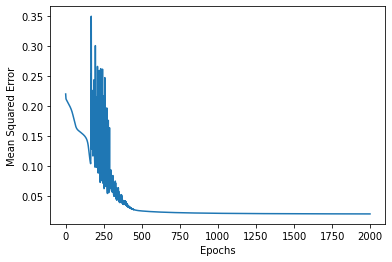

In [ ]:

weight_matrices = []
ffn = FirstFFNetwork()
ffn.fit(X_train, Y_train, epochs=2000, learning_rate=5, display_loss=True, display_weight=True)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: UserWarning: The following kwargs were not used by contour: 'aplha'
  # Remove the CWD from sys.path while we load stuff.


True

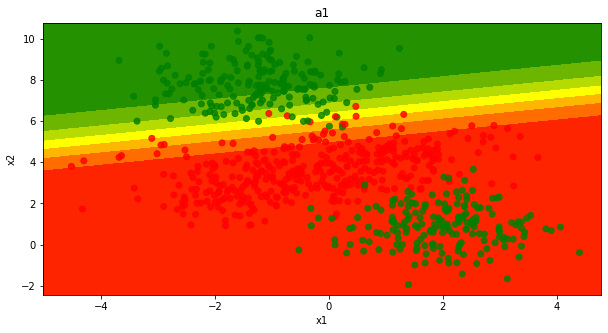

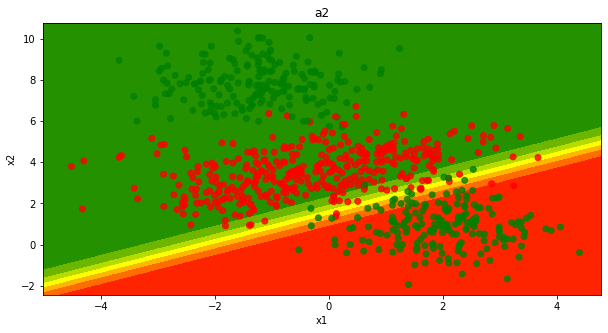

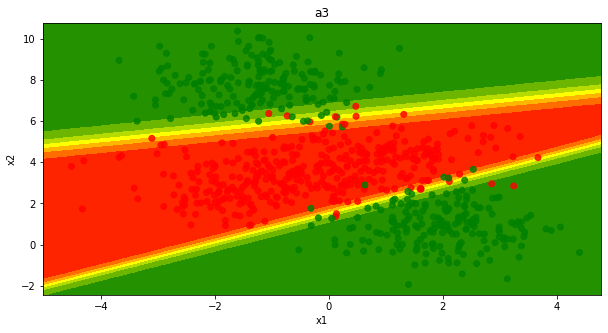

In [ ]:
def make_meshgrid(x, y, h=0.2):
  x_min, x_max = x.min()-0.5, x.max()+0.5
  y_min, y_max = y.min()-0.5, y.max()+0.5
  xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
  return xx, yy

def plot_contours(ax, predict, xx, yy, **params):
  Z = predict(np.c_[xx.ravel(), yy.ravel()])    #ravel flattens the xx, yy np.c_ gives 1 value of each xx and yy as a tuple to predict function (ie in pairs of x and y)
  Z = Z.reshape(xx.shape)
  out = ax.contourf(xx, yy, Z, **params)          #plotting a feild contour
  return out

def plot_boundary():
  xx, yy = make_meshgrid(X_train[:,0], X_train[:,1])
  predict_functions = [ffn.predict_a1, ffn.predict_a2, ffn.predict_a3]

  for i in range(3):
    fig, ax = plt.subplots(figsize = (10,5))

    plot_contours(ax, predict_functions[i], xx, yy, cmap=my_cmap, aplha=0.2)
    
    ax.scatter(X_train[:,0], X_train[:,1], c=Y_train, cmap=my_cmap, alpha=0.8)
    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())
    ax.set_xlabel('x1')
    ax.set_ylabel('x2')
    ax.set_title("a"+str(i+1))

  return True

plot_boundary()

In [ ]:
def plot_heat_map(epoch):
  fig = plt.figure(figsize=(10,1))
  sns.heatmap(weight_matrices[epoch], annot=True, cmap=my_cmap, vmin=-3, vmax=3)
  plt.title("Epoch "+str(epoch))

  fig.canvas.draw()
  image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
  image = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))

  return image

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


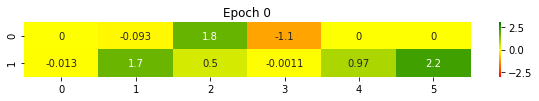

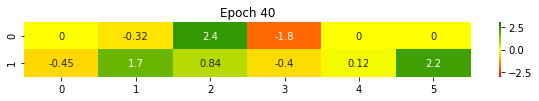

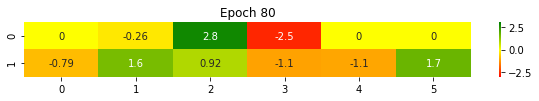

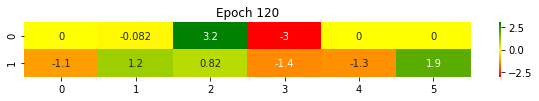

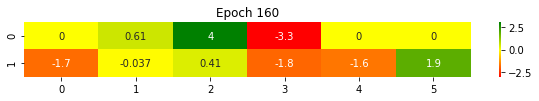

...

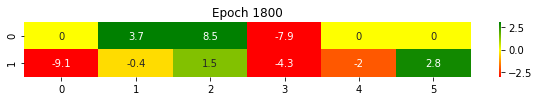

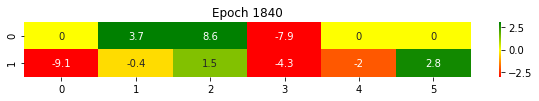

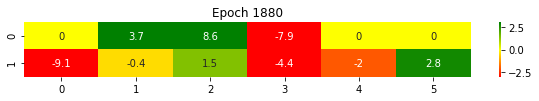

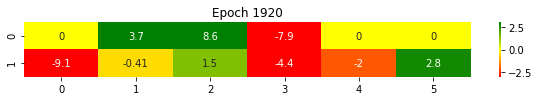

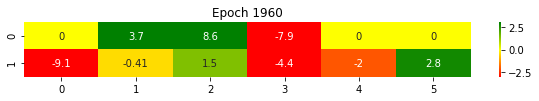

In [ ]:
imageio.mimsave('./weights_viz.gif', [plot_heat_map(i) for i in range(0,len(weight_matrices),len(weight_matrices)//50)], fps=1)

In [ ]:
from IPython import display
HTML('<img src="weights_viz.gif">')

In [ ]:
!ls

sample_data  weights_viz.gif


In [ ]:
Y_train_pred = ffn.predict(X_train)
Y_train_pred_binarized = (Y_train_pred >= 0.5).astype("int").ravel()
Y_val_pred = ffn.predict(X_val)
Y_val_pred_binarized = (Y_val_pred >= 0.5).astype("int").ravel()

accuracy_train = accuracy_score(Y_train_pred_binarized, Y_train)
accuracy_val = accuracy_score(Y_val_pred_binarized, Y_val)

print("Accuracy on training data is :",round(accuracy_train, 2))
print("Accuracy on validation data is : ",round(accuracy_val, 2))

Accuracy on training data is : 0.98
Accuracy on validation data is :  0.94


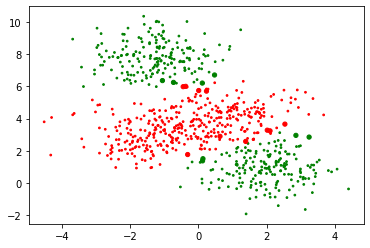

In [ ]:
plt.scatter(X_train[:,0], X_train[:,1], c=Y_train_pred_binarized, cmap=my_cmap, s=15*(np.abs(Y_train_pred_binarized-Y_train)+0.2))
plt.show()

#MultiClass Classification

In [ ]:
X_train, X_val, Y_train, Y_val = train_test_split(data, labels_orig, stratify=labels_orig, random_state=0)
print(X_train.shape, X_val.shape, labels_orig.shape)

(750, 2) (250, 2) (1000,)


In [ ]:
enc = OneHotEncoder()
# 0 -> (1, 0, 0, 0)     1-> (0, 1, 0, 0)      2 -> (0, 0, 1, 0)     3 -> (0, 0, 0, 1)
y_OH_train = enc.fit_transform(np.expand_dims(Y_train, 1)).toarray()
y_OH_val = enc.fit_transform(np.expand_dims(Y_val, 1)).toarray()
print(y_OH_train.shape, y_OH_val.shape) 

(750, 4) (250, 4)


In [ ]:
class FFSN_MultiClass_Specific :

  def __init__(self):
    self.w1 = np.random.randn()
    self.w2 = np.random.randn()
    self.w3 = np.random.randn()
    self.w4 = np.random.randn()
    self.w5 = np.random.randn()
    self.w6 = np.random.randn()
    self.w7 = np.random.randn()
    self.w8 = np.random.randn()
    self.w9 = np.random.randn()
    self.w10 = np.random.randn()
    self.w11 = np.random.randn()
    self.w12 = np.random.randn()
    self.b1 = 0
    self.b2 = 0
    self.b3 = 0
    self.b4 = 0
    self.b5 = 0
    self.b6 = 0

  def sigmoid(self, x):
    return 1.0/(1.0 + np.exp(-x))

  def forward_pass(self, x):
    #input layer
    self.x1, self.x2 = x

    #layer 1
    self.z1 = self.w1*self.x1 + self.w2*self.x2 + self.b1
    self.a1 = self.sigmoid(self.z1)
    self.z2 = self.w3*self.x1 + self.w4*self.x2 + self.b2
    self.a2 = self.sigmoid(self.z2)

    #output layer (softmax at o/p)
    self.z3 = self.w5*self.a1 + self.w6*self.a2 + self.b3
    self.z4 = self.w7*self.a1 + self.w8*self.a2 + self.b4
    self.z5 = self.w8*self.a1 + self.w10*self.a2 + self.b5
    self.z6 = self.w11*self.a1 + self.w12*self.a2 + self.b6
    sum_exps = np.sum([np.exp(self.z3),np.exp(self.z4),np.exp(self.z5),np.exp(self.z6)])
    self.a3 = np.exp(self.z3)/sum_exps
    self.a4 = np.exp(self.z4)/sum_exps
    self.a5 = np.exp(self.z5)/sum_exps
    self.a6 = np.exp(self.z6)/sum_exps

    return np.array([self.a3, self.a4, self.a5, self.a6])

  def grad(self, x, y):
    self.forward_pass(x)
    self.y1, self.y2, self.y3, self.y4 = y

    self.dw5 = (self.a3-self.y1) * self.a1
    self.dw6 = (self.a3-self.y1) * self.a2
    self.db3 = (self.a3-self.y1)

    self.dw7 = (self.a4-self.y2) * self.a1
    self.dw8 = (self.a4-self.y2) * self.a2
    self.db4 = (self.a4-self.y2)

    self.dw9 = (self.a5-self.y3) * self.a1
    self.dw10 = (self.a5-self.y3) * self.a2
    self.db5 = (self.a5-self.y3)

    self.dw11 = (self.a6-self.y4) * self.a1
    self.dw12 = (self.a6-self.y4) * self.a2
    self.db6 = self.a6-self.y4

    self.da1 = (self.a3-self.y1)*self.w5 + (self.a4-self.y2)*self.w7 + (self.a5-self.y3)*self.w9 + (self.a6-self.y4)*self.w11
    self.dw1 = self.da1 * self.a1*(1-self.a1) * self.x1
    self.dw2 = self.da1 * self.a1*(1-self.a1) * self.x2
    self.db1 = self.da1 * self.a1*(1-self.a1)

    self.da2 = (self.a3-self.y1)*self.w6 + (self.a4-self.y2)*self.w8 + (self.a5-self.y3)*self.w10 + (self.a6-self.y4)*self.w12
    self.dw3 = self.da2 * self.a2*(1-self.a2) * self.x1
    self.dw4 = self.da2 * self.a2*(1-self.a2) * self.x2
    self.db2 = self.da2 * self.a2*(1-self.a2)


  def short_grad(self, x, y):
    self.forward_pass(x)
    self.y1, self.y2, self.y3, self.y4 = y

    self.da3 = (self.a3-self.y1)
    self.da4 = (self.a4-self.y2)
    self.da5 = (self.a5-self.y3)
    self.da6 = (self.a6-self.y4)

    self.dw5 = self.da3 * self.a1
    self.dw6 = self.da3 * self.a2
    self.db3 = self.da3

    self.dw7 = self.da4 * self.a1
    self.dw8 = self.da4 * self.a2
    self.db4 = self.da4

    self.dw9 = self.da5 * self.a1
    self.dw10 = self.da5 * self.a2
    self.db5 = self.da5

    self.dw11 = self.da6 * self.a1
    self.dw12 = self.da6 * self.a2
    self.db6 = self.da6

    self.da1 = self.da3*w5 + self.da4*w7 + self.da5*w9 + self.da6*w11
    self.dz1 = self.da1 * self.a1*(1-self.a1)
    self.dw1 = self.dz1 * self.x1
    self.dw2 = self.dz1 * self.x2
    self.db1 = self.dz1

    self.da2 = self.da3*w6 + self.da4*w8 + self.da5*w10 + self.da6*w12
    self.dz2 = self.da2 * self.a2*(1-self.a2)
    self.dw3 = self.dz2 * self.x1
    self.dw4 = self.dz2 * self.x2
    self.db2 = self.dz2

  def predict(self, X):
    Y_pred = []
    for x in X:
      y_pred = self.forward_pass(x)
      Y_pred.append(y_pred)
    return np.array(Y_pred)

  def predict_a1(self, X):
    Y_pred = []
    for x in X :
      y_pred = self.forward_pass(x)
      Y_pred.append(self.a1)
    return np.array(Y_pred)

  def predict_a2(self, X):
    Y_pred = []
    for x in X :
      y_pred = self.forward_pass(x)
      Y_pred.append(self.a2)
    return np.array(Y_pred) 

  def predict_a3(self, X):
    Y_pred = []
    for x in X :
      y_pred = self.forward_pass(x)
      Y_pred.append(self.a3)
    return np.array(Y_pred)

  def predict_a4(self, X):
    Y_pred = []
    for x in X :
      y_pred = self.forward_pass(x)
      Y_pred.append(self.a4)
    return np.array(Y_pred)

  def predict_a5(self, X):
    Y_pred = []
    for x in X :
      y_pred = self.forward_pass(x)
      Y_pred.append(self.a5)
    return np.array(Y_pred)

  def predict_a6(self, X):
    Y_pred = []
    for x in X :
      y_pred = self.forward_pass(x)
      Y_pred.append(self.a6)
    return np.array(Y_pred)

  def fit(self, X, Y, epochs=1, learning_rate=1, display_loss=False, display_weight=False):
    if display_loss:
      loss = {}

    for i in tqdm(range(epochs), total=epochs, unit='epoch'):
      dw1, dw2, dw3, dw4, dw5, dw6, dw7, dw8, dw9, dw10, dw11, dw12, db1, db2, db3, db4, db5, db6 = [0]*18
      for x,y in zip(X,Y):
        self.grad(x,y)
        dw1 += self.dw1
        dw2 += self.dw2
        dw3 += self.dw3
        dw4 += self.dw4
        dw5 += self.dw5
        dw6 += self.dw6
        dw7 += self.dw7
        dw8 += self.dw8
        dw9 += self.dw9
        dw10 += self.dw10
        dw11 += self.dw11
        dw12 += self.dw12
        db1 += self.db1
        db2 += self.db2
        db3 += self.db3
        db4 += self.db4
        db5 += self.db5
        db6 += self.db6

      m = X.shape[0]
      self.w1 -= learning_rate * dw1/m
      self.w2 -= learning_rate * dw2/m
      self.w3 -= learning_rate * dw3/m
      self.w4 -= learning_rate * dw4/m
      self.w5 -= learning_rate * dw5/m
      self.w6 -= learning_rate * dw6/m
      self.w7 -= learning_rate * dw7/m
      self.w8 -= learning_rate * dw8/m
      self.w9 -= learning_rate * dw9/m
      self.w10 -= learning_rate * dw10/m
      self.w11 -= learning_rate * dw11/m
      self.w12 -= learning_rate * dw12/m  
      self.db1 -= learning_rate * db1/m
      self.db2 -= learning_rate * db2/m
      self.db3 -= learning_rate * db3/m
      self.db4 -= learning_rate * db4/m
      self.db5 -= learning_rate * db5/m
      self.db6 -= learning_rate * db6/m

      if display_loss:
        Y_pred = self.predict(X)
        loss[i] = log_loss(np.argmax(Y, axis=1), Y_pred)

      if display_weight:
        weight_matrix = np.array([[self.b3, self.w5, self.w6, 
                                   self.b4, self.w7, self.w8, 
                                   self.b5, self.w9, self.w10, 
                                   self.b6, self.w11, self.w12], 
                                  [0, 0, 0,
                                   self.b1, self.w1, self.w2,
                                   self.b2, self.w3, self.w4, 
                                   0, 0, 0]])    
        weight_matrices.append(weight_matrix)

    if display_loss:
      plt.plot(list(loss.values()))
      plt.xlabel('Epochs')
      plt.ylabel('Log Loss')
      plt.show()

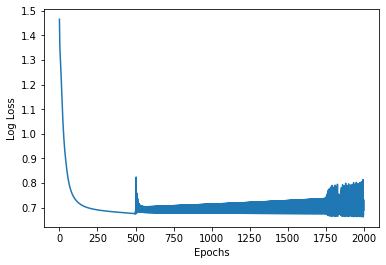

In [ ]:
weight_matrices = []
ffsn_multi_specific = FFSN_MultiClass_Specific()
ffsn_multi_specific.fit(X_train, y_OH_train, epochs=2000, learning_rate=1, display_loss=True, display_weight=True)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


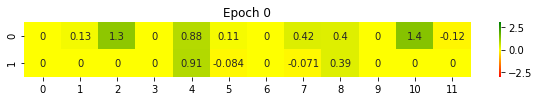

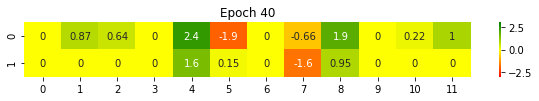

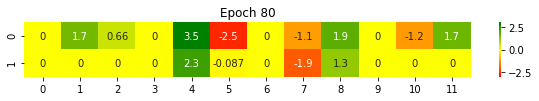

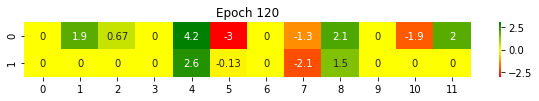

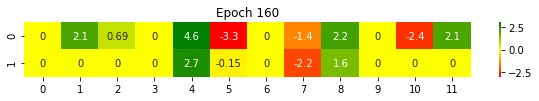

...

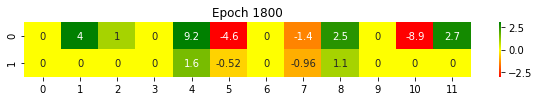

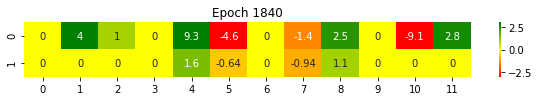

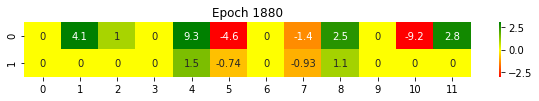

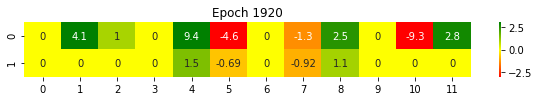

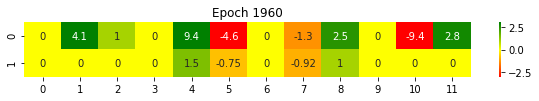

In [ ]:
imageio.mimsave("./weights_viz_multi_class.gif", [plot_heat_map(i) for i in range(0, len(weight_matrices), len(weight_matrices)//50)], fps=1)

In [ ]:
Y_pred_train = ffsn_multi_specific.predict(X_train)
Y_pred_train = np.argmax(Y_pred_train, 1)

Y_pred_val = ffsn_multi_specific.predict(X_val)
Y_pred_val = np.argmax(Y_pred_val, 1)

accuracy_train = accuracy_score(Y_pred_train, Y_train)
accuracy_val = accuracy_score(Y_pred_val, Y_val)

print("Training accuracy :",round(accuracy_train, 2))
print("Validation accuracy :",round(accuracy_val, 2))


Training accuracy : 0.69
Validation accuracy : 0.72


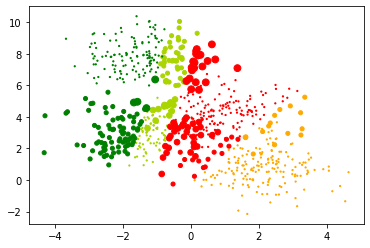

In [ ]:
plt.scatter(X_train[:,0], X_train[:,1], c=Y_pred_train, cmap=my_cmap, s=15*(np.abs(Y_pred_train-Y_train)+0.1))
plt.show()

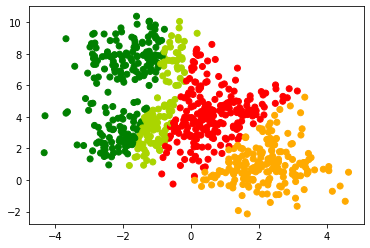

In [ ]:
plt.scatter(X_train[:,0], X_train[:,1], c=Y_pred_train, cmap=my_cmap)
plt.show()

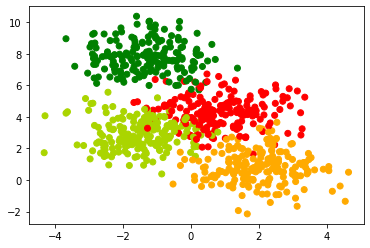

In [ ]:
plt.scatter(X_train[:,0], X_train[:,1], c=Y_train, cmap=my_cmap )
plt.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: UserWarning: The following kwargs were not used by contour: 'aplha'
  # Remove the CWD from sys.path while we load stuff.


True

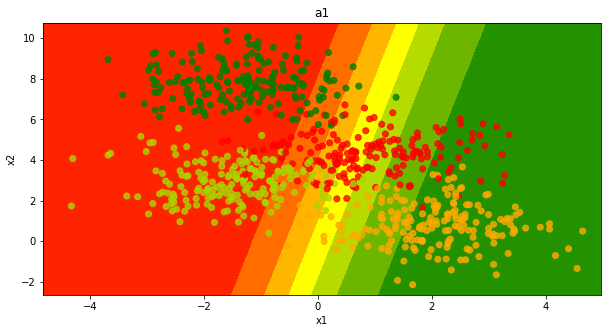

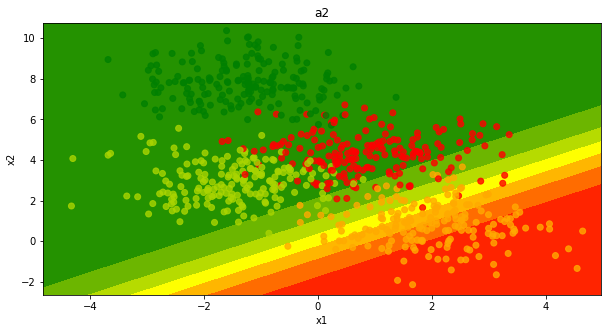

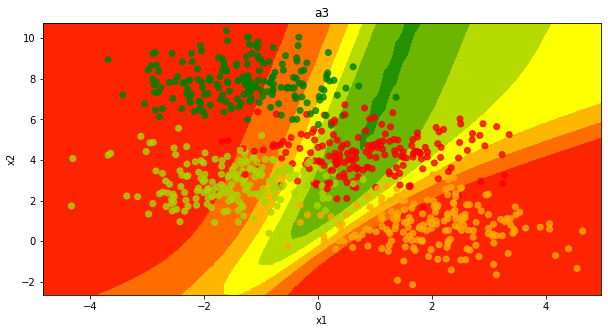

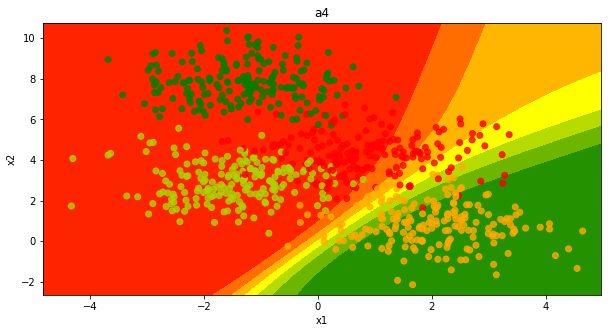

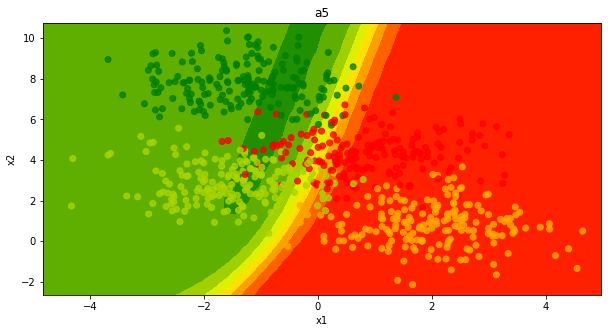

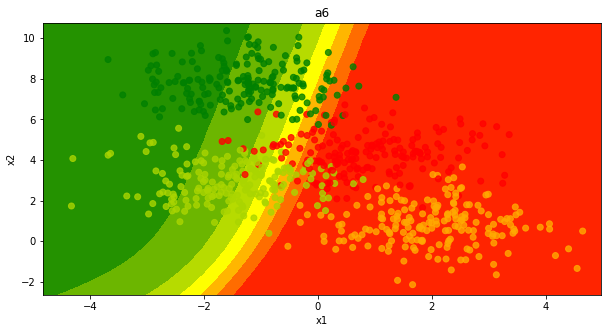

In [ ]:
def make_meshgrid(x, y, h=0.2):
  x_min, x_max = x.min()-0.5, x.max()+0.5
  y_min, y_max = y.min()-0.5, y.max()+0.5
  xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
  return xx, yy

def plot_contours(ax, predict, xx, yy, **params):
  Z = predict(np.c_[xx.ravel(), yy.ravel()])    #ravel flattens the xx, yy np.c_ gives 1 value of each xx and yy as a tuple to predict function (ie in pairs of x and y)
  Z = Z.reshape(xx.shape)
  out = ax.contourf(xx, yy, Z, **params)          #plotting a feild contour
  return out

def plot_boundary():
  xx, yy = make_meshgrid(X_train[:,0], X_train[:,1])
  predict_functions = [ffsn_multi_specific.predict_a1, ffsn_multi_specific.predict_a2, ffsn_multi_specific.predict_a3, ffsn_multi_specific.predict_a4, ffsn_multi_specific.predict_a5, ffsn_multi_specific.predict_a6]

  for i in range(6):
    fig, ax = plt.subplots(figsize = (10,5))

    plot_contours(ax, predict_functions[i], xx, yy, cmap=my_cmap, aplha=0.2)
    
    ax.scatter(X_train[:,0], X_train[:,1], c=Y_train, cmap=my_cmap, alpha=0.8)
    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())
    ax.set_xlabel('x1')
    ax.set_ylabel('x2')
    ax.set_title("a"+str(i+1))

  return True

plot_boundary()

#Exercises
1. Code the backpropagation algorithm with the NN shown to the right
2. Plot the contour maps for multi-class classification and visualize the output of each neuron
3. (Advanced) Visualise the contour maps for first simple network as an animation. For every training of 100 epochs generate one frame with the contour maps of the three neurons.

In [ ]:
class layer2network :

  def __init__(self):
    self.w1 = np.random.randn()
    self.w2 = np.random.randn()
    self.w3 = np.random.randn()
    self.w4 = np.random.randn()
    self.w5 = np.random.randn()
    self.w6 = np.random.randn()
    self.w7 = np.random.randn()
    self.w8 = np.random.randn()
    self.w9 = np.random.randn()
    self.w10 = np.random.randn()
    self.b1 = 0
    self.b2 = 0
    self.b3 = 0
    self.b4 = 0
    self.b5 = 0

  def sigmoid(self, x):
    return 1.0/(1.0 + np.exp(-x))

  def forward_pass(self, x):
    #Input layer
    self.x1, self.x2 = x

    #first hidden layer
    self.z1 = self.w1*self.x1 + self.w2*self.x2 + self.b1
    self.a1 = self.sigmoid(self.z1)
    self.z2= self.w3*self.x1 + self.w4*self.x2 + self.b2
    self.a2 = self.sigmoid(self.z2)

    #Second hidden layer
    self.z3 = self.w5*self.a1 + self.w6*self.a2 + self.b3
    self.a3 = self.sigmoid(self.z3)
    self.z4 = self.w7*self.a1 + self.w8*self.a2 + self.b4
    self.a4 = self.sigmoid(self.z4) 

    #Output layer
    self.z5 = self.w9*self.a3 + self.w10*self.a4 + self.b5
    self.a5 = self.sigmoid(self.z5)

    return self.a5



  def grad(self, x, y):
    self.forward_pass(x)

    self.dz5 = (self.a5-y) * self.a5*(1-self.a5)

    self.dw9 = self.dz5 * self.a3
    self.dw10 = self.dz5 * self.a4
    self.db5 = self.dz5

    self.dw5 = (self.a5-y) * self.a5*(1-self.a5) * self.w9 * self.a3*(1-self.a3) * self.a1
    self.dw6 = (self.a5-y) * self.a5*(1-self.a5) * self.w9 * self.a3*(1-self.a3) * self.a2
    self.db3 = (self.a5-y) * self.a5*(1-self.a5) * self.w9 * self.a3*(1-self.a3)

    self.dw7 = (self.a5-y) * self.a5*(1-self.a5) * self.w10 * self.a4*(1-self.a4) * self.a1
    self.dw8 = (self.a5-y) * self.a5*(1-self.a5) * self.w10 * self.a4*(1-self.a4) * self.a2
    self.db4 = (self.a5-y) * self.a5*(1-self.a5) * self.w10 * self.a4*(1-self.a4)

    self.dw1 = (((self.a5-y) * self.a5*(1-self.a5) * self.w9 * self.a3*(1-self.a3))*self.w5 + ((self.a5-y) * self.a5*(1-self.a5) * self.w10 * self.a4*(1-self.a4))*self.w7) * self.a1*(1-self.a1) * self.x1
    self.dw2 = (((self.a5-y) * self.a5*(1-self.a5) * self.w9 * self.a3*(1-self.a3))*self.w5 + ((self.a5-y) * self.a5*(1-self.a5) * self.w10 * self.a4*(1-self.a4))*self.w7) * self.a1*(1-self.a1) * self.x2
    self.db1 = (((self.a5-y) * self.a5*(1-self.a5) * self.w9 * self.a3*(1-self.a3))*self.w5 + ((self.a5-y) * self.a5*(1-self.a5) * self.w10 * self.a4*(1-self.a4))*self.w7) * self.a1*(1-self.a1)

    self.dw3 = ((self.a5-y) * self.a5*(1-self.a5) * self.w9 * self.a3*(1-self.a3) * self.w6 +  (self.a5-y) * self.a5*(1-self.a5) * self.w9 * self.a3*(1-self.a3) * self.w8) * self.a2*(1-self.a2) * self.x1
    self.dw4 = ((self.a5-y) * self.a5*(1-self.a5) * self.w9 * self.a3*(1-self.a3) * self.w6 +  (self.a5-y) * self.a5*(1-self.a5) * self.w9 * self.a3*(1-self.a3) * self.w8) * self.a2*(1-self.a2) * self.x2
    self.db2 = ((self.a5-y) * self.a5*(1-self.a5) * self.w9 * self.a3*(1-self.a3) * self.w6 +  (self.a5-y) * self.a5*(1-self.a5) * self.w9 * self.a3*(1-self.a3) * self.w8) * self.a2*(1-self.a2) 



  def fit(self, X, Y, epochs=1, learning_rate=1, display_loss=False, display_weight=False, initialize=True):

    if initialize:
      self.w1 = np.random.randn()
      self.w2 = np.random.randn()
      self.w3 = np.random.randn()
      self.w4 = np.random.randn()
      self.w5 = np.random.randn()
      self.w6 = np.random.randn()
      self.w7 = np.random.randn()
      self.w8 = np.random.randn()
      self.w9 = np.random.randn()
      self.w10 = np.random.randn()
      self.b1 = 0
      self.b2 = 0
      self.b3 = 0
      self.b4 = 0
      self.b5 = 0

    if display_loss:
      loss = {}

    for i in tqdm(range(epochs), total=epochs, unit="epoch"):
      dw1, dw2, dw3, dw4, dw5, dw6, dw7, dw8, dw9, dw10, db1, db2, db3, db4, db5 = [0]*15
      for x,y in zip(X, Y):
        self.grad(x, y)
        dw1 += self.dw1
        dw2 += self.dw2
        dw3 += self.dw3
        dw4 += self.dw4
        dw5 += self.dw5 
        dw6 += self.dw6
        dw7 += self.dw7
        dw8 += self.dw8
        dw9 += self.dw9
        dw10 += self.dw10
        db1 += self.db1
        db2 += self.db2
        db3 += self.db3
        db4 += self.db4
        db5 += self.db5

      m = X.shape[0]
      self.w1 -= learning_rate * dw1/m
      self.w2 -= learning_rate * dw2/m
      self.w3 -= learning_rate * dw3/m
      self.w4 -= learning_rate * dw4/m
      self.w5 -= learning_rate * dw5/m
      self.w6 -= learning_rate * dw6/m
      self.w7 -= learning_rate * dw7/m
      self.w8 -= learning_rate * dw8/m
      self.w9 -= learning_rate * dw9/m
      self.w10 -= learning_rate * dw10/m
      self.b1 -= learning_rate * db1/m
      self.b2 -= learning_rate * db2/m
      self.b3 -= learning_rate * db3/m
      self.b4 -= learning_rate * db4/m
      self.b5 -= learning_rate * db5/m

      if display_loss:
        Y_pred = self.predict(X)
        loss[i] = mean_squared_error(Y_pred, Y)

      if display_weight:
        weight_matrix = np.array([[0,self.b5, self.w9, self.w10, 0, 0], [self.b3, self.w5, self.w6, self.w7, self.w8, self.b4], [self.b1, self.w1, self.w2, self.w3, self.w4, self.b2]])
        weight_matrices.append(weight_matrix)


    if display_loss:
      plt.plot(list(loss.values()))
      plt.xlabel("Epochs")
      plt.ylabel("Mean squared error")
      plt.show()


  def predict(self, X):
    Y_pred = []
    for x in X:
      y_pred = self.forward_pass(x)
      Y_pred.append(y_pred)
    return np.array(Y_pred)


  def predict_a1(self, X):
    Y_pred = []
    for x in X:
      y_pred = self.forward_pass(x)
      Y_pred.append(self.a1)
    return np.array(Y_pred)


  def predict_a2(self, X):
    Y_pred = []
    for x in X:
      y_pred = self.forward_pass(x)
      Y_pred.append(self.a2)
    return np.array(Y_pred)


  def predict_a3(self, X):
    Y_pred = []
    for x in X:
      y_pred = self.forward_pass(x)
      Y_pred.append(self.a3)
    return np.array(Y_pred)


  def predict_a4(self, X):
    Y_pred = []
    for x in X:
      y_pred = self.forward_pass(x)
      Y_pred.append(self.a4)
    return np.array(Y_pred)


  def predict_a5(self, X):
    Y_pred = []
    for x in X:
      y_pred = self.forward_pass(x)
      Y_pred.append(self.a5)
    return np.array(Y_pred)
    



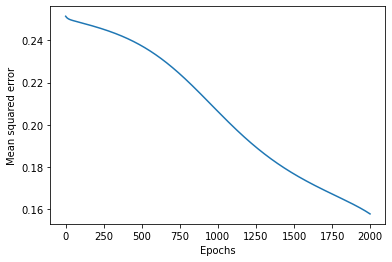

In [ ]:
weight_matrices = []
l2net = layer2network()
l2net.fit(X_train, Y_train, epochs=2000, learning_rate=0.5, display_loss=True, display_weight=True)

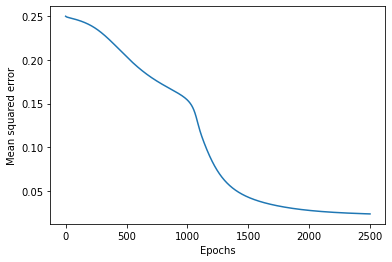

In [ ]:
weight_matrices = []
l2net2 = layer2network()
l2net2.fit(X_train, Y_train, epochs=2500, learning_rate=0.9, display_loss=True, display_weight=True)

In [ ]:
def make_meshgrid(x, y, h=0.2):
  x_min, x_max = x.min()-0.5, x.max()+0.5
  y_min, y_max = y.min()-0.5, y.max()+0.5
  xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
  return xx, yy

def plot_contours(ax, predict, xx, yy, **params):
  Z = predict(np.c_[xx.ravel(), yy.ravel()])
  Z = Z.reshape(xx.shape)
  out = ax.contourf(xx, yy, Z, **params)
  return out

def plot_boundary():
  xx, yy = make_meshgrid(X_train[:,0], X_train[:,1])
  predict_functions = [l2net2.predict_a1, l2net2.predict_a2, l2net2.predict_a3, l2net2.predict_a4, l2net2.predict_a5]

  for i in range(5):
    fig, ax = plt.subplots(figsize=(10,5))
    plot_contours(ax, predict_functions[i], xx, yy, cmap=my_cmap, alpha=0.2)
    ax.scatter(X_train[:,0], X_train[:,1], c=Y_train, cmap=my_cmap, alpha=0.8)
    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())
    ax.set_xlabel("X1")
    ax.set_ylabel("X2")
    ax.set_title("a"+str(i+1))
  
  return True

True

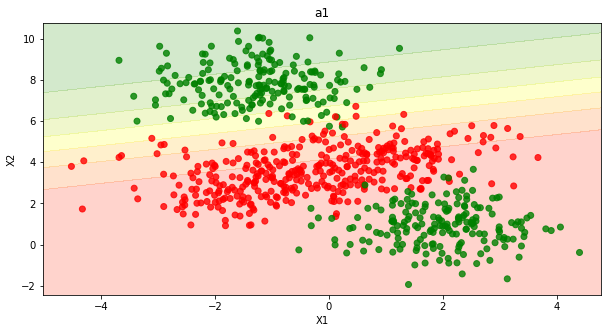

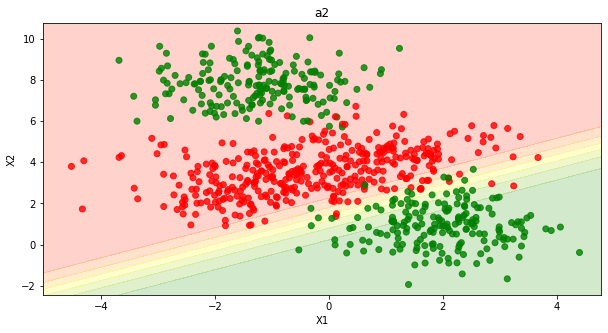

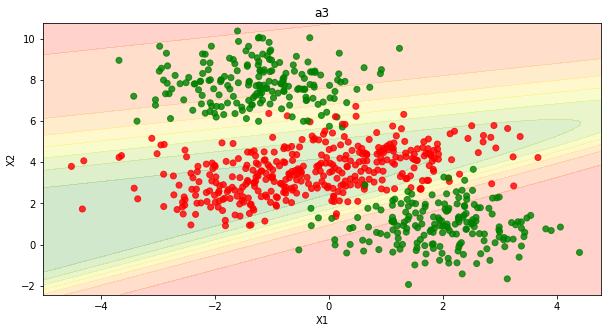

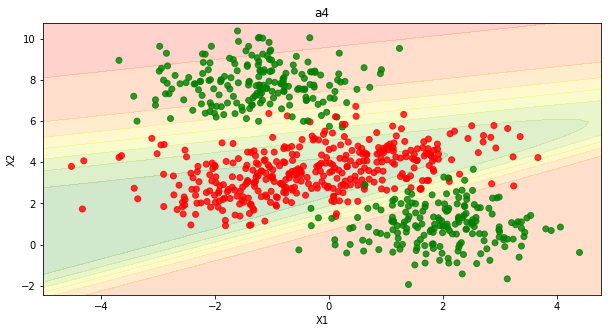

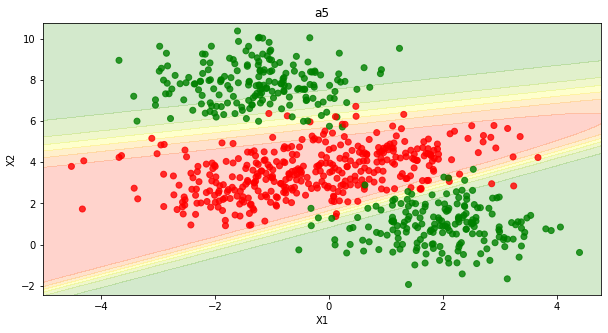

In [ ]:
plot_boundary()

In [ ]:
def plot_boundary_epoch(epoch):
    fig = plt.figure(figsize=(10, 5))
    plot_boundary()
    plt.title("Epoch "+str(epoch))

    fig.canvas.draw()
    image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
    image = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))

    return image

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<Figure size 720x360 with 0 Axes>

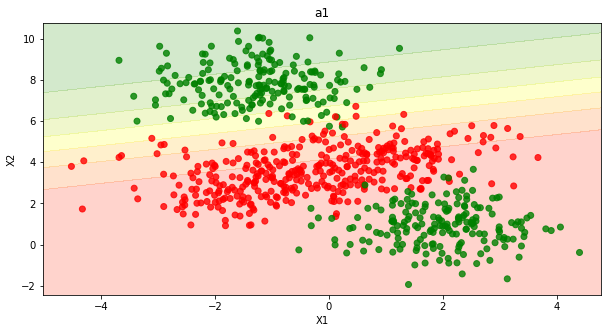

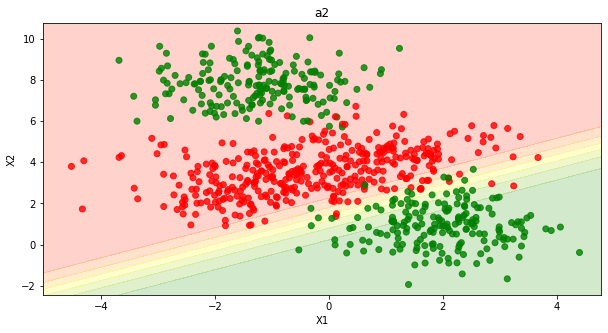

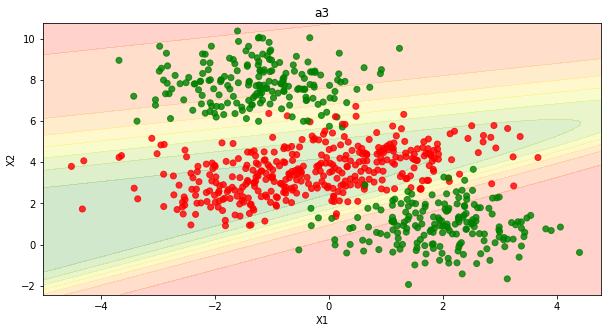

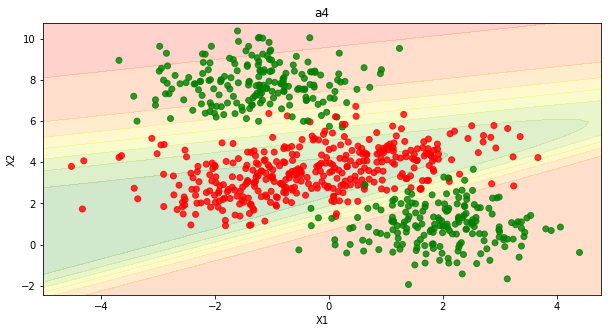

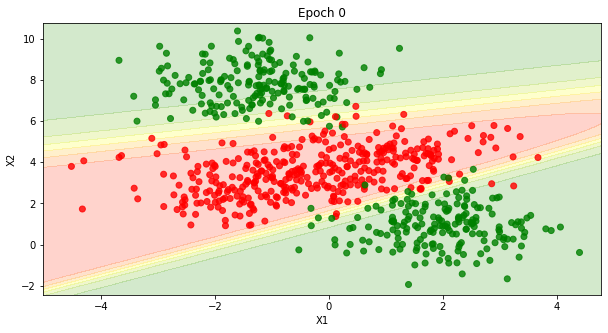

<Figure size 720x360 with 0 Axes>

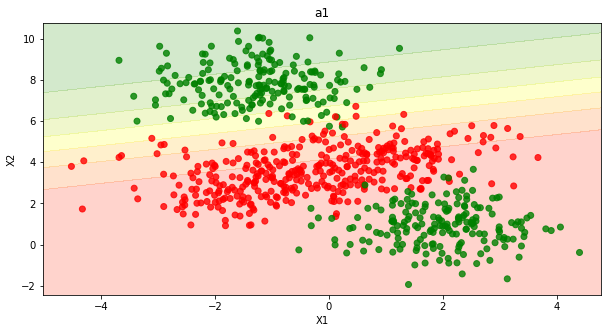

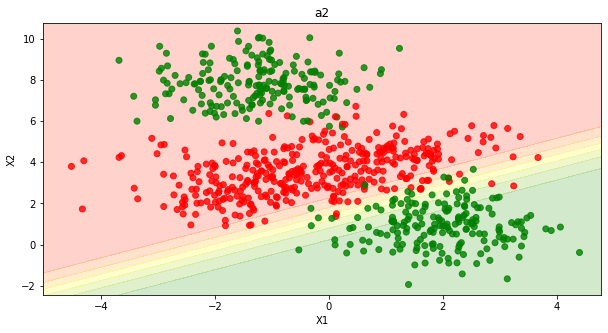

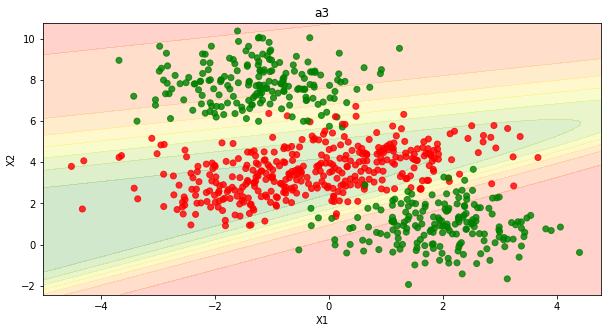

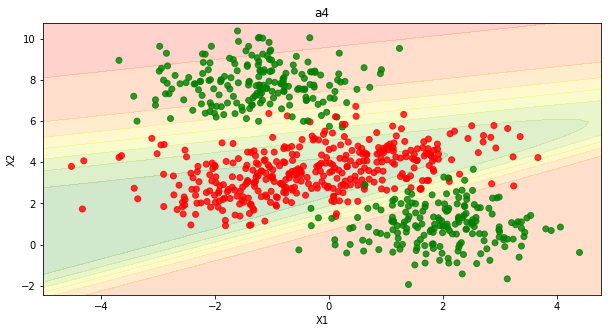

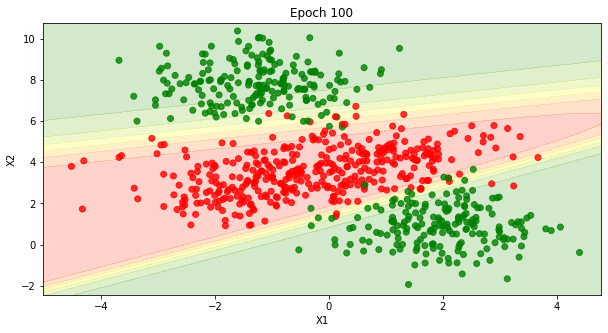

<Figure size 720x360 with 0 Axes>

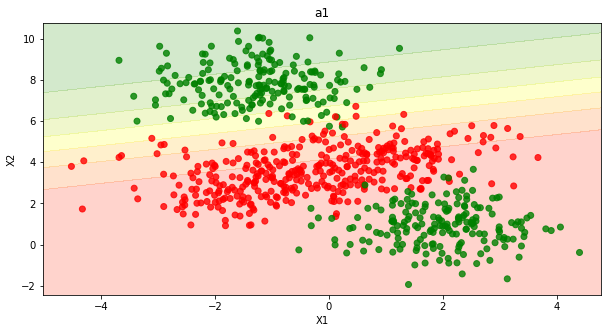

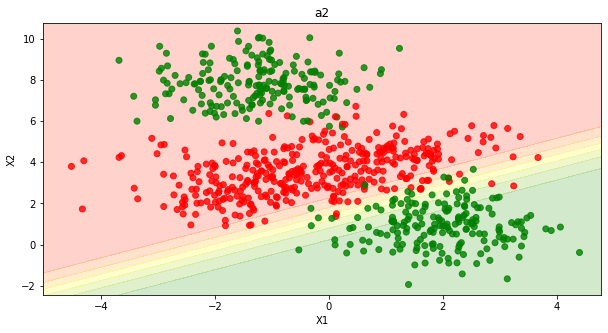

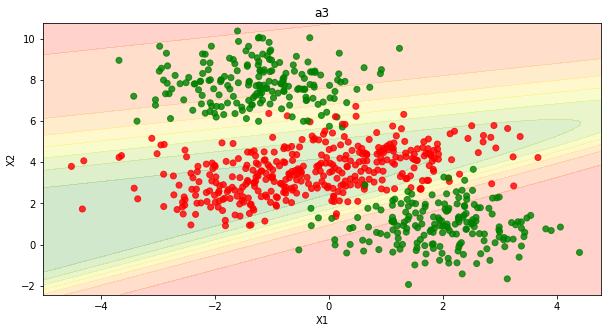

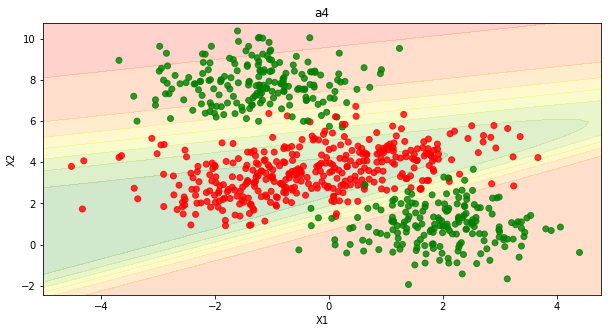

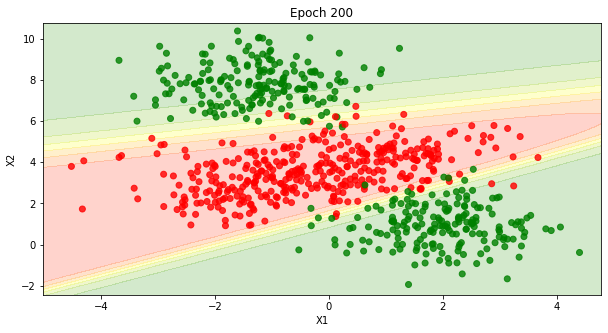

<Figure size 720x360 with 0 Axes>

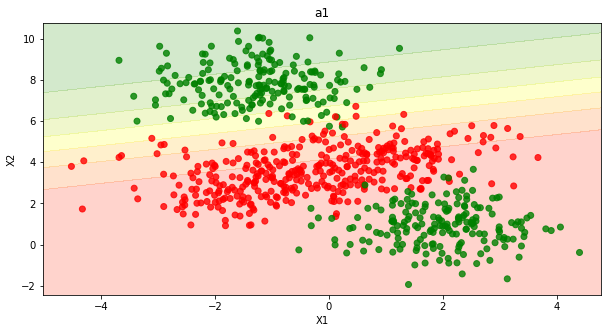

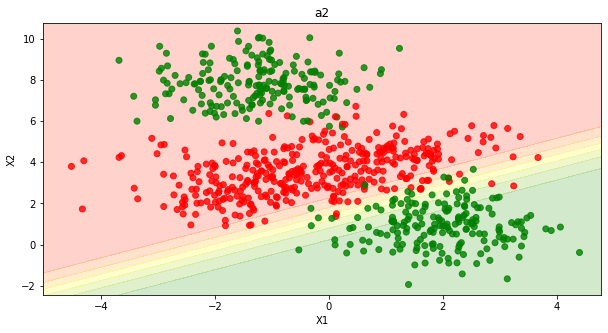

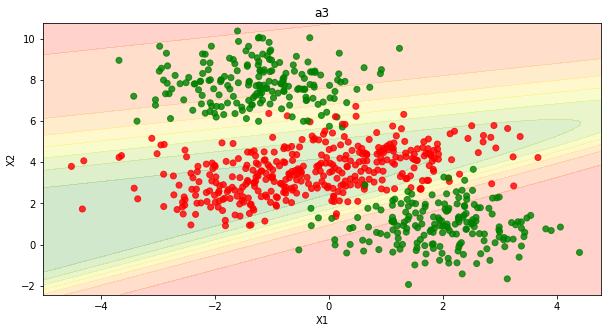

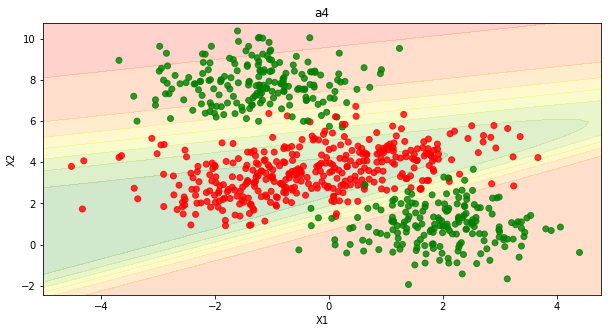

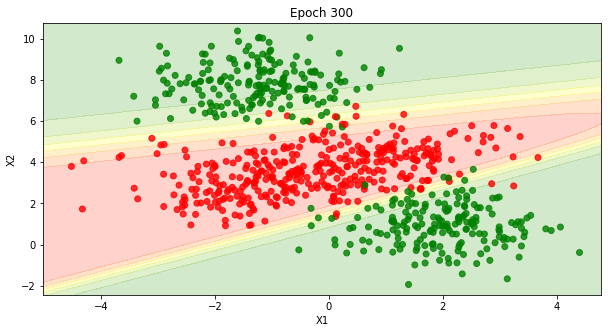

<Figure size 720x360 with 0 Axes>

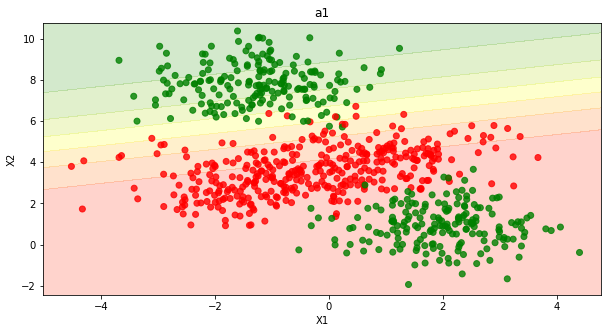

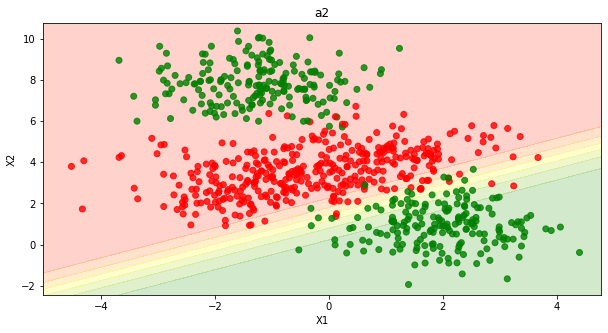

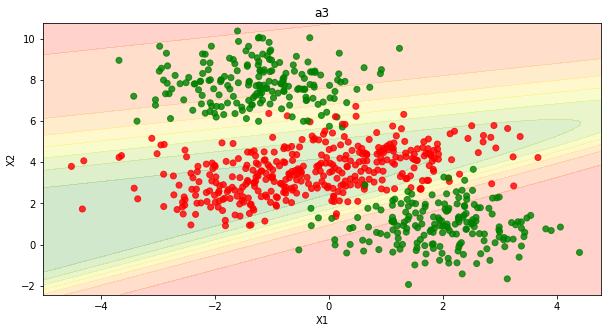

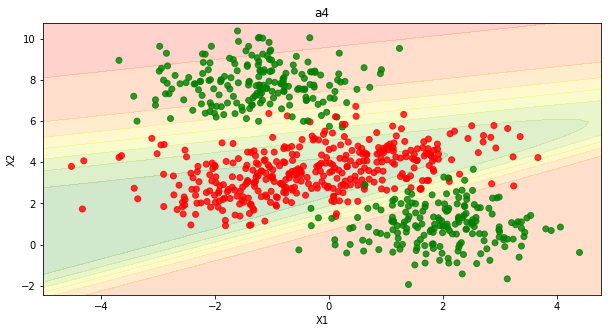

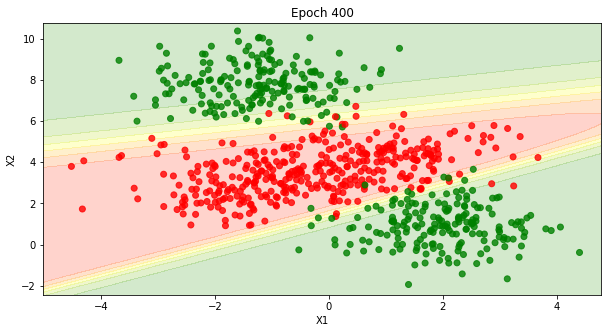

<Figure size 720x360 with 0 Axes>

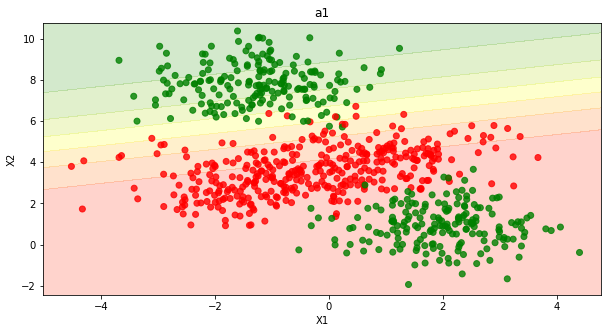

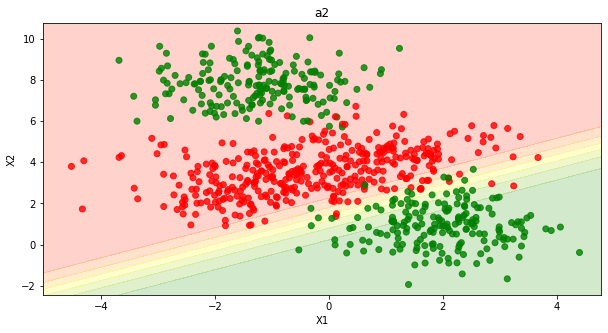

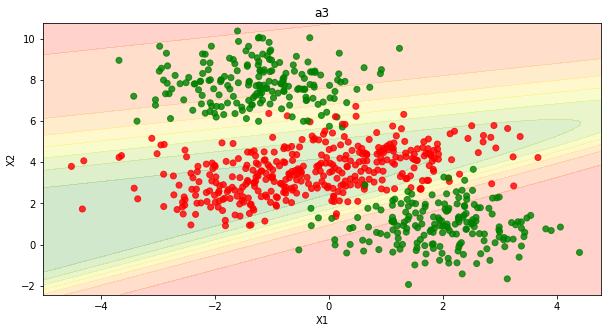

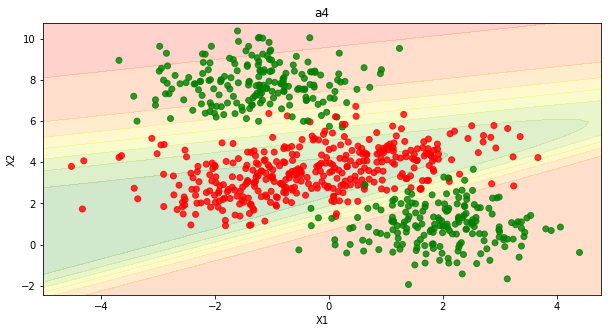

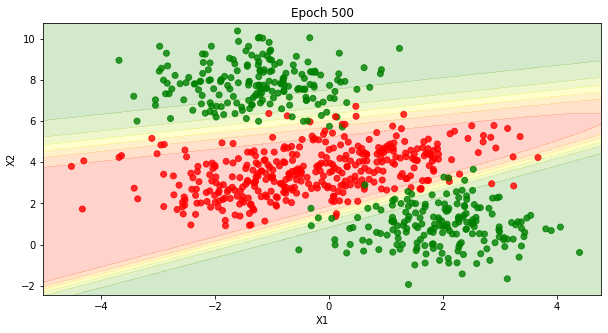

<Figure size 720x360 with 0 Axes>

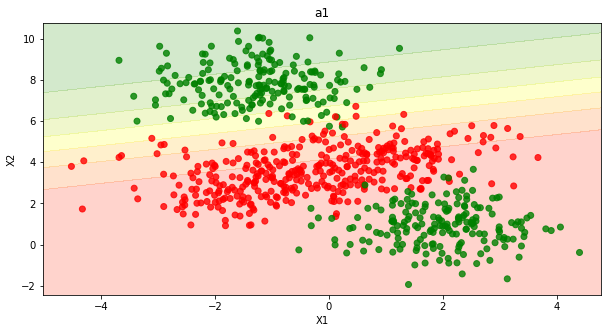

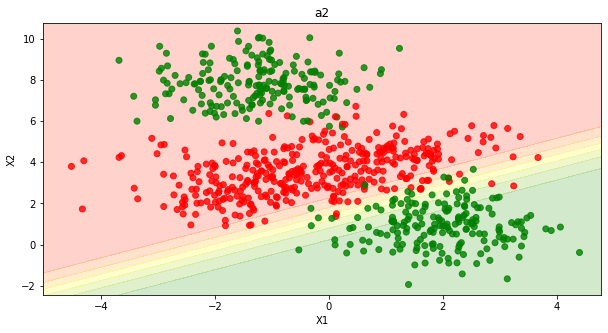

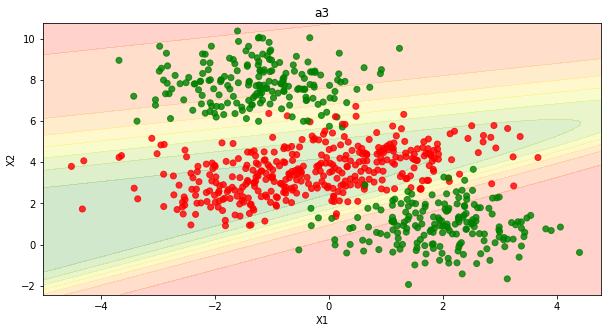

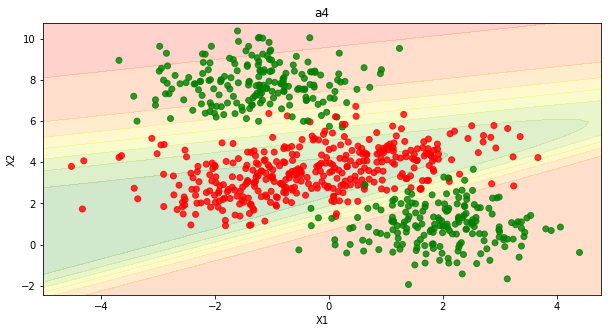

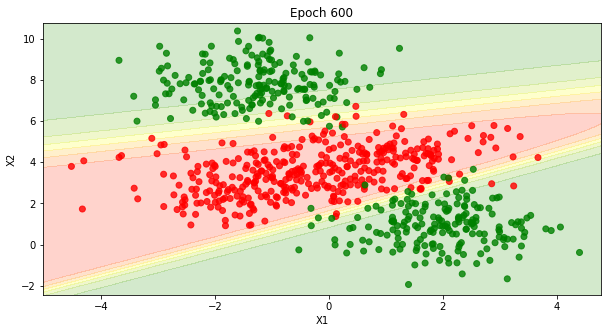

<Figure size 720x360 with 0 Axes>

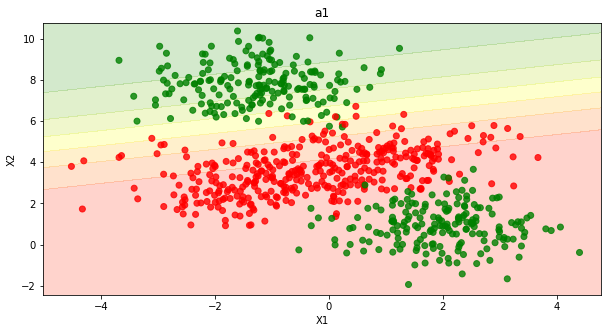

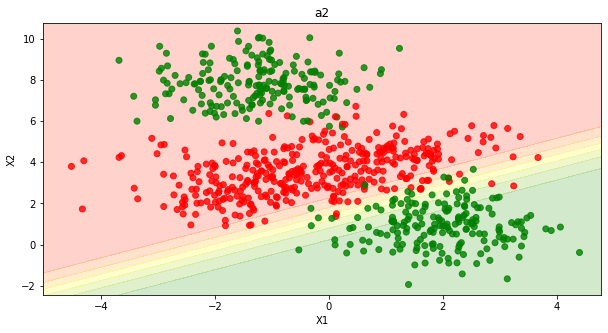

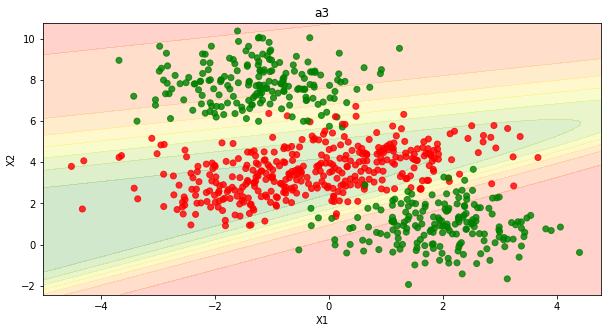

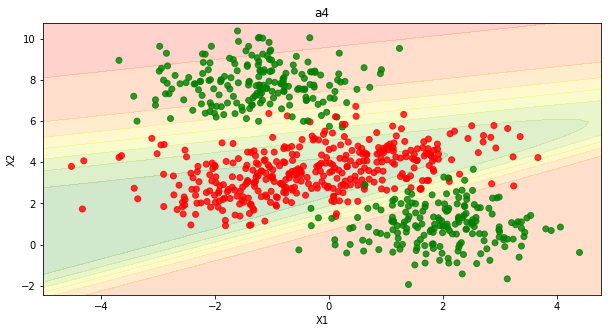

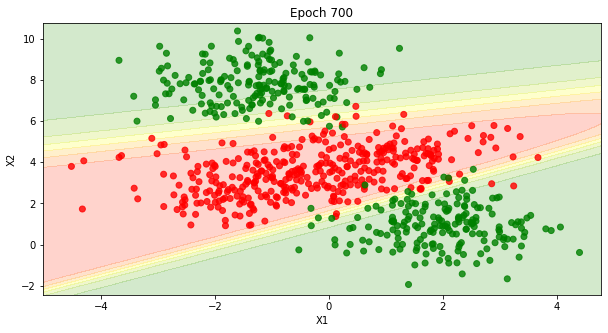

<Figure size 720x360 with 0 Axes>

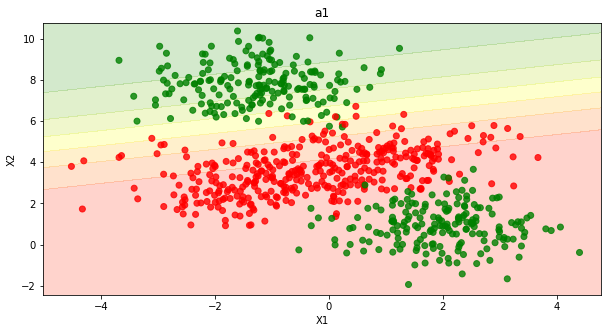

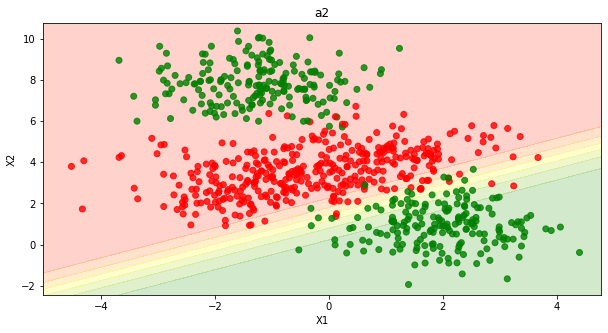

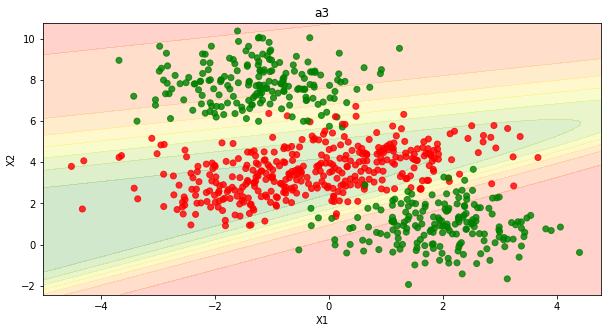

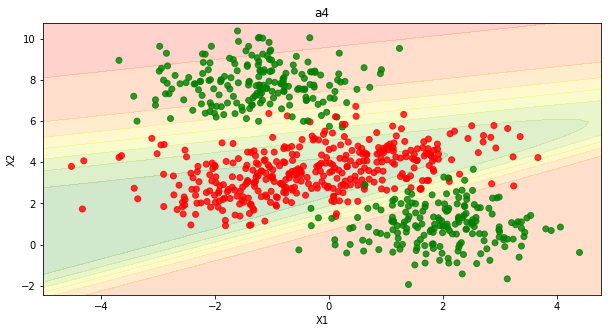

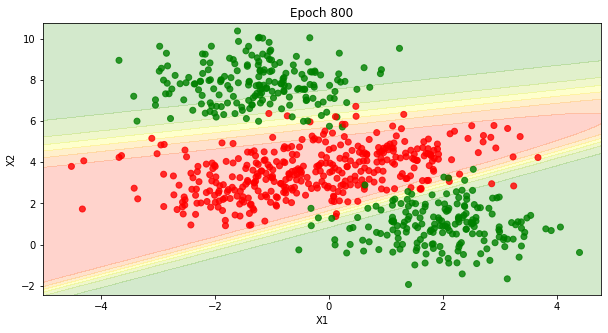

<Figure size 720x360 with 0 Axes>

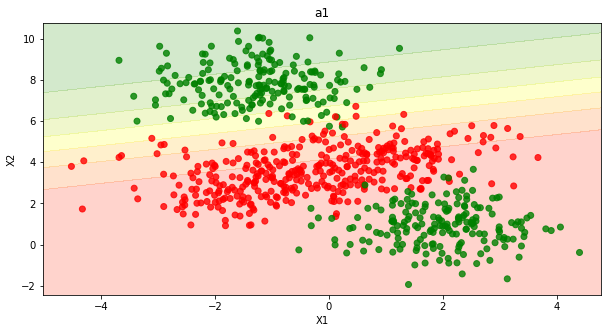

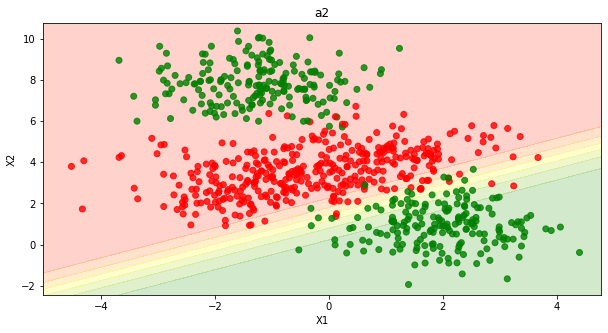

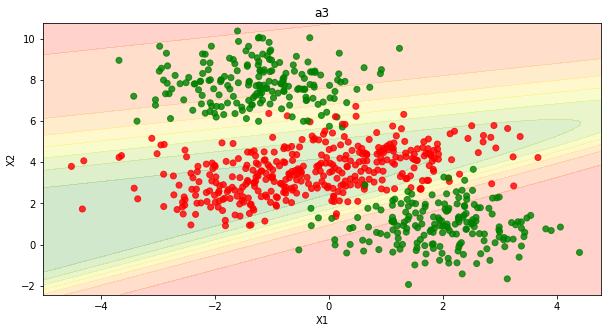

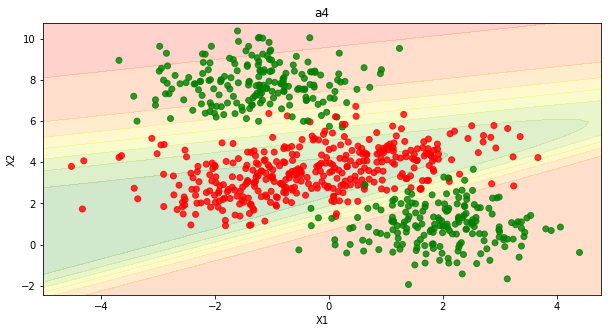

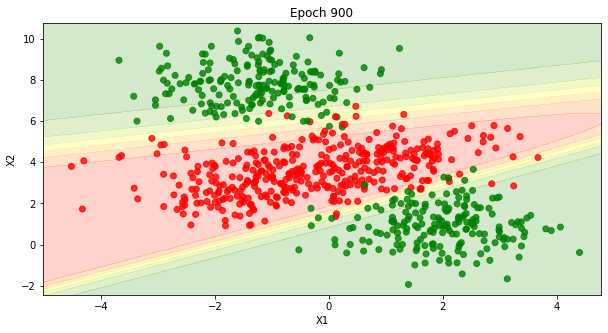

<Figure size 720x360 with 0 Axes>

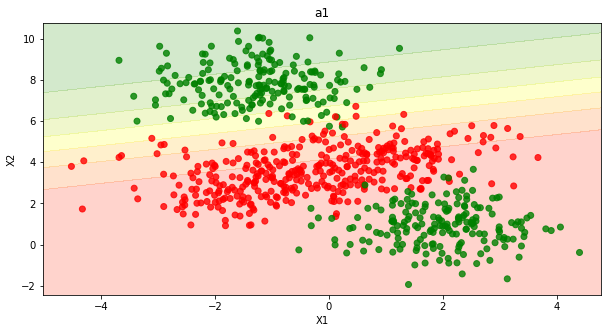

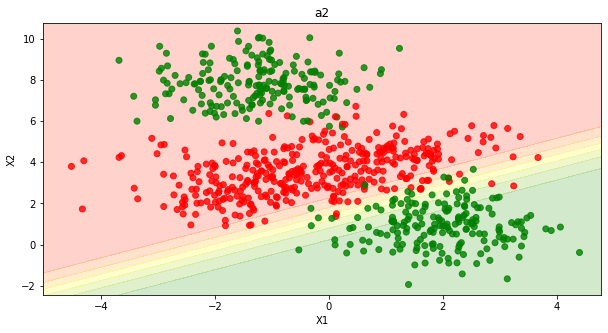

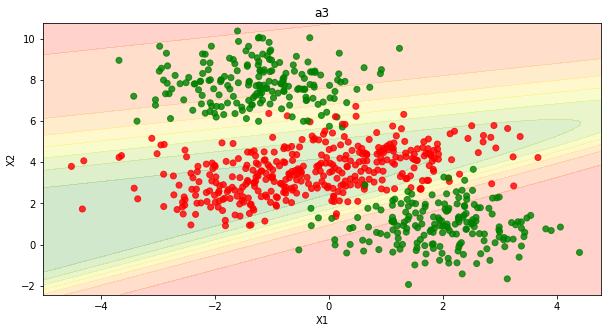

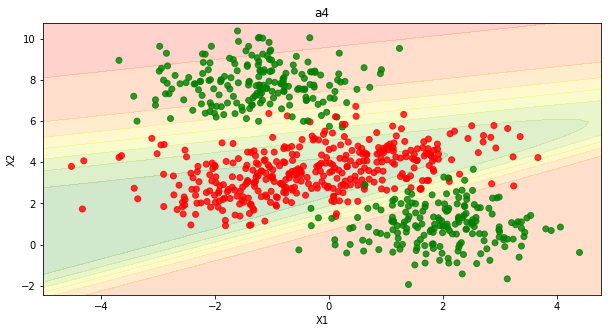

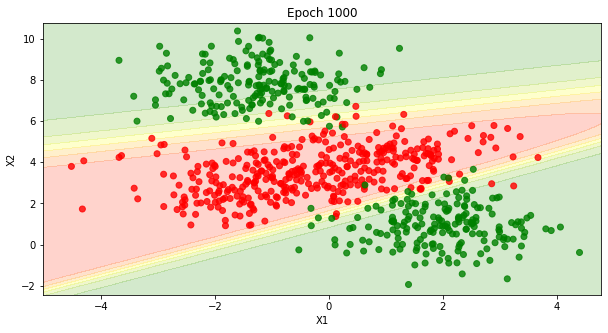

<Figure size 720x360 with 0 Axes>

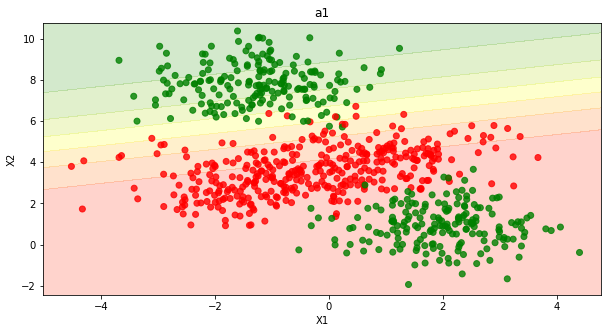

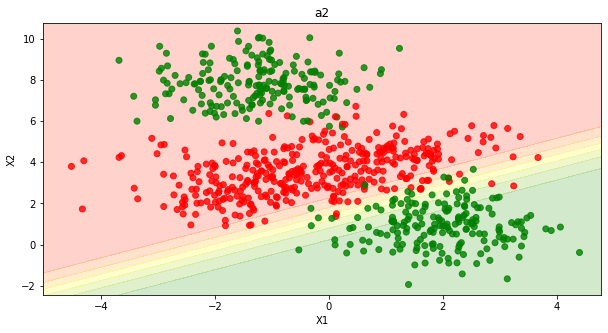

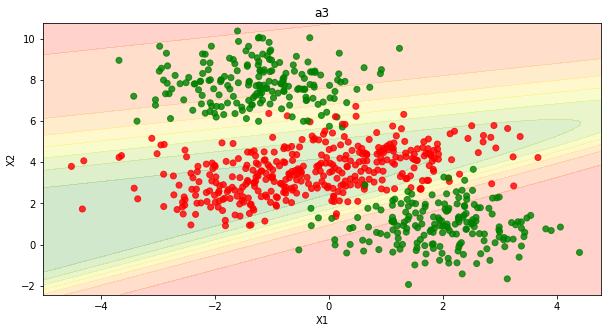

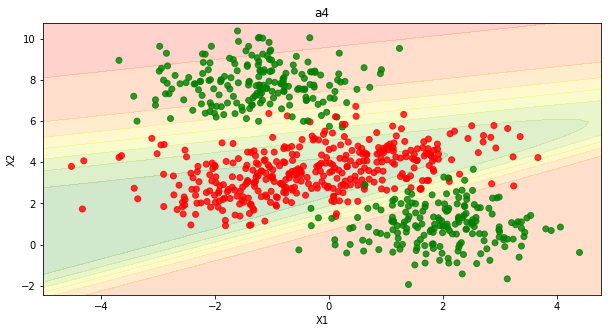

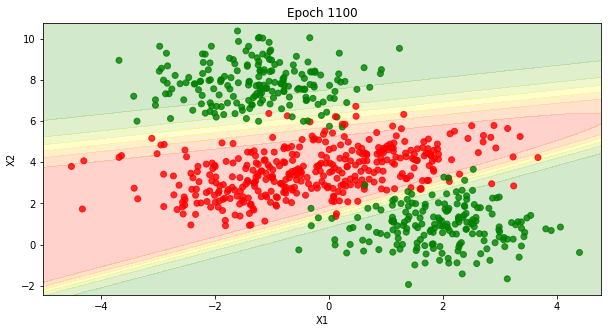

<Figure size 720x360 with 0 Axes>

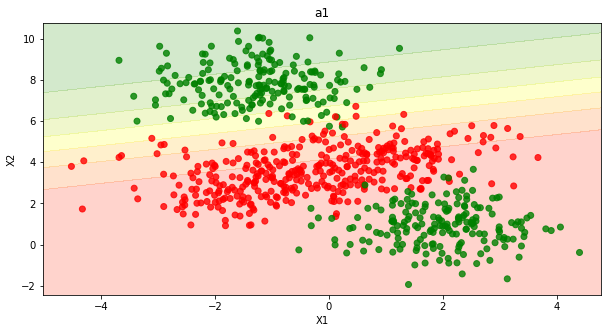

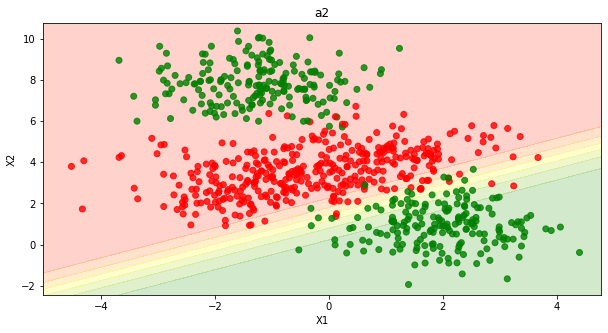

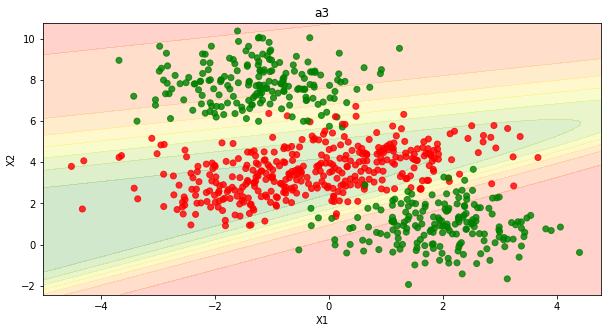

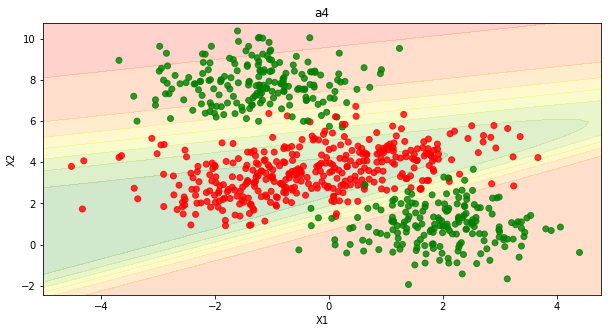

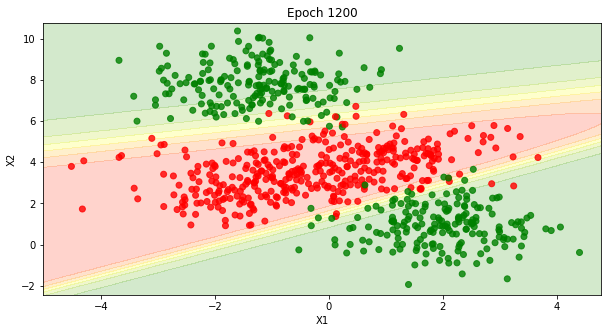

<Figure size 720x360 with 0 Axes>

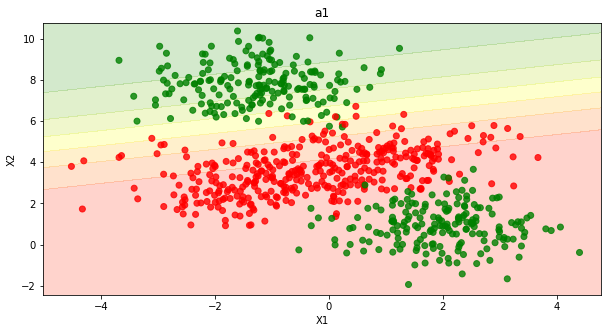

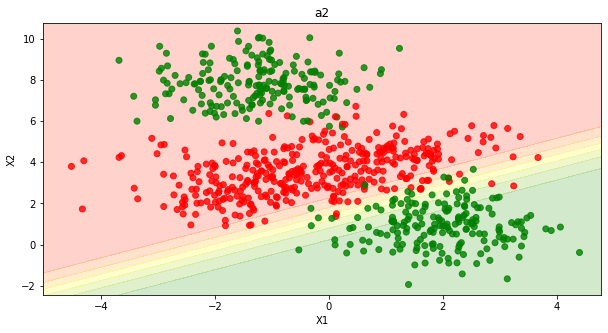

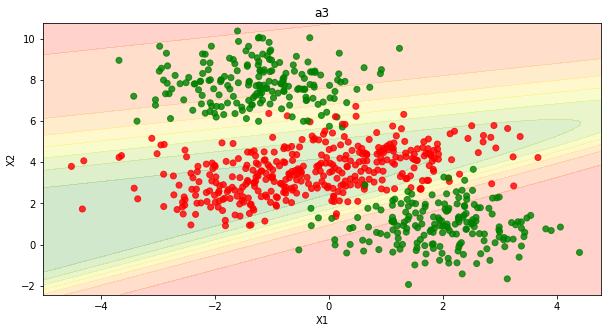

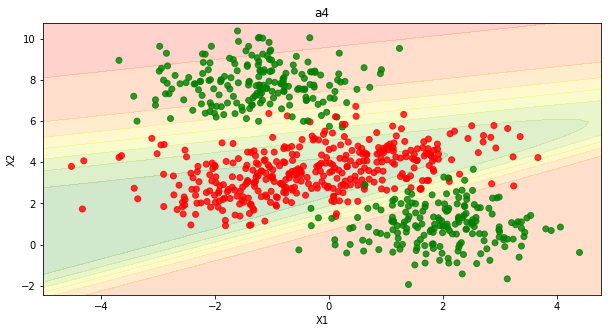

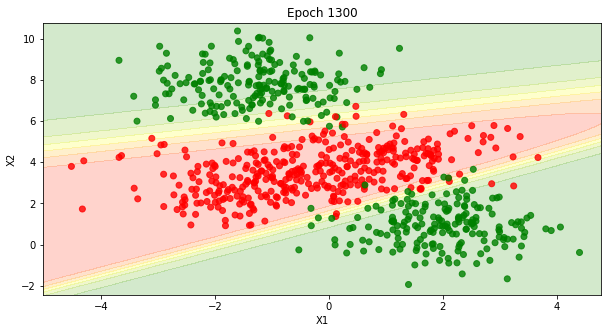

<Figure size 720x360 with 0 Axes>

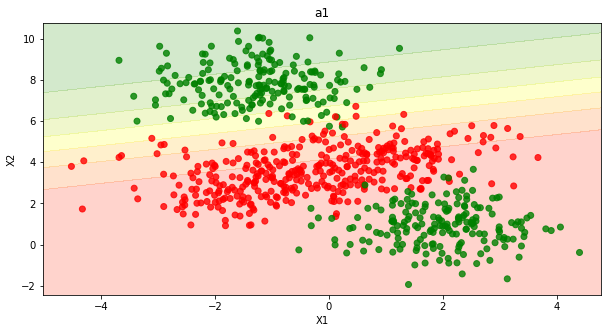

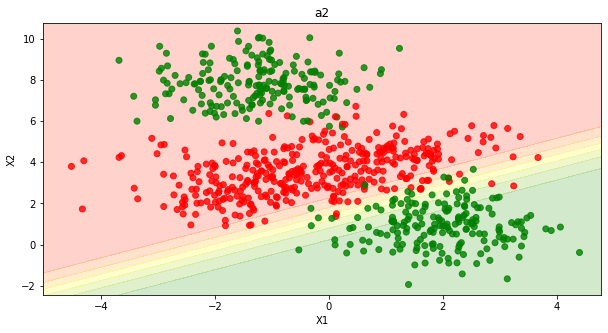

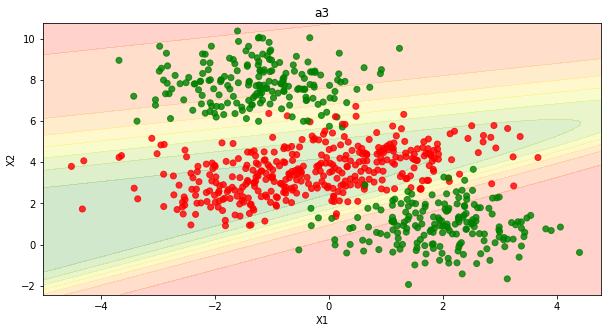

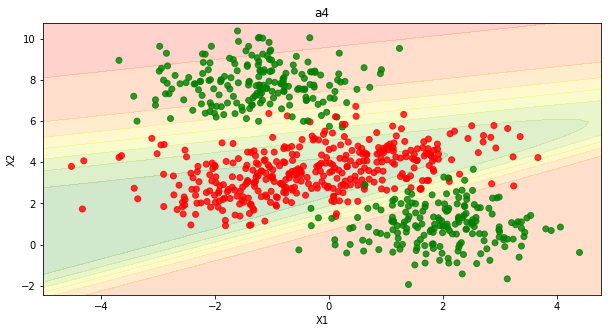

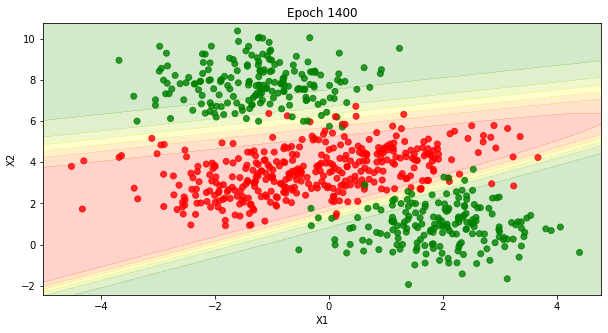

<Figure size 720x360 with 0 Axes>

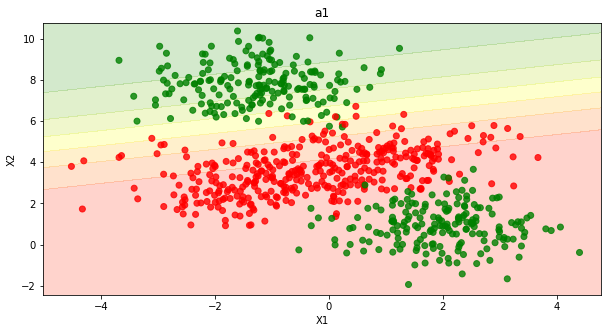

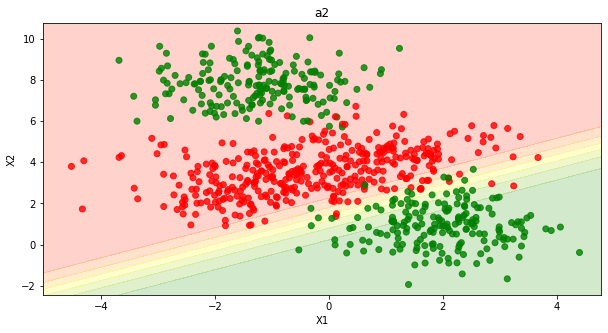

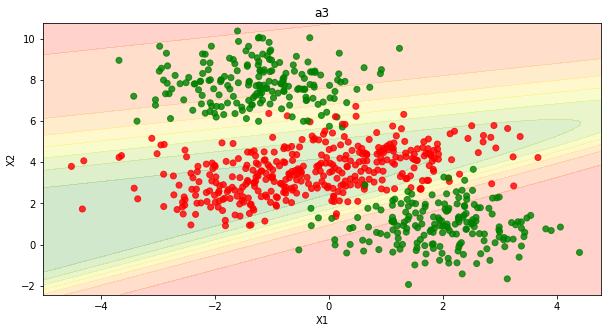

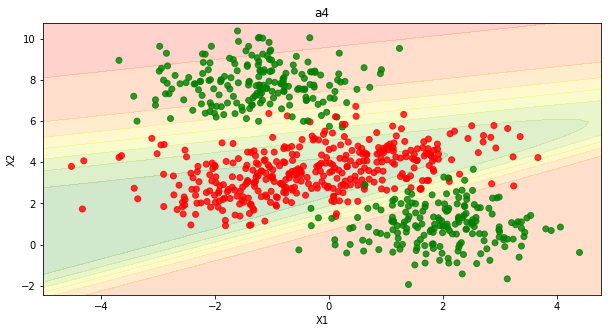

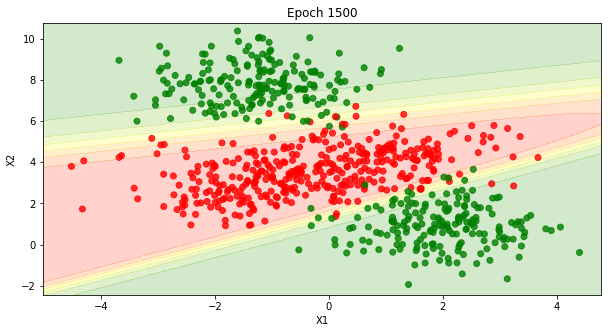

<Figure size 720x360 with 0 Axes>

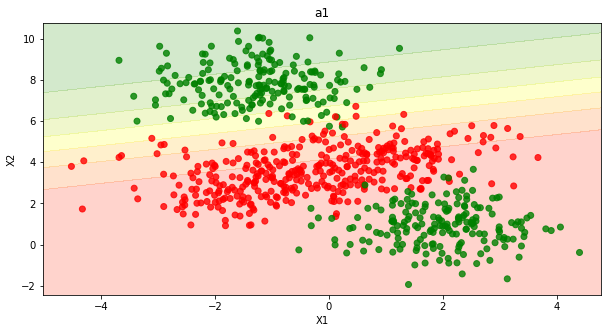

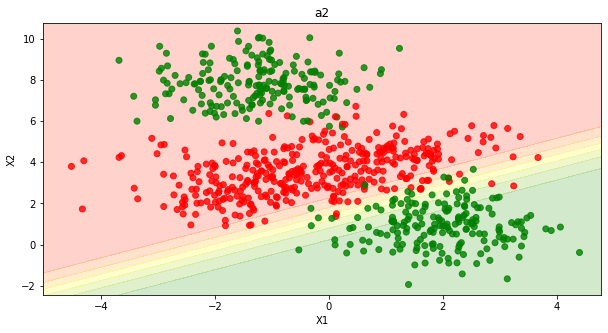

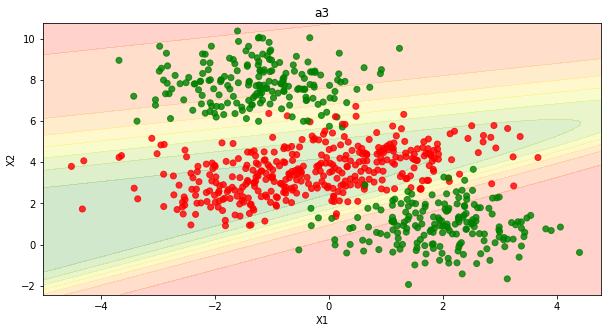

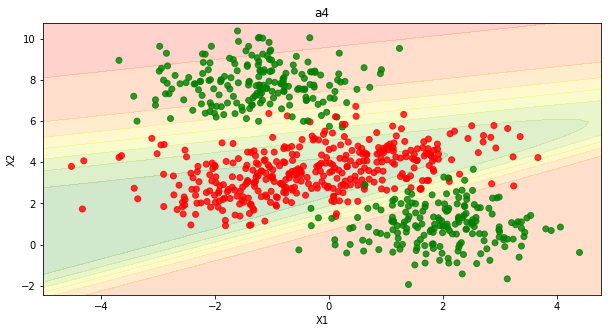

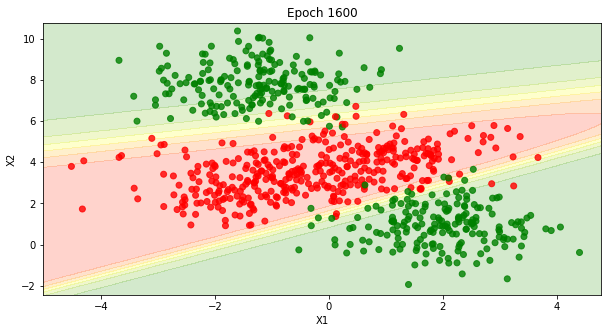

<Figure size 720x360 with 0 Axes>

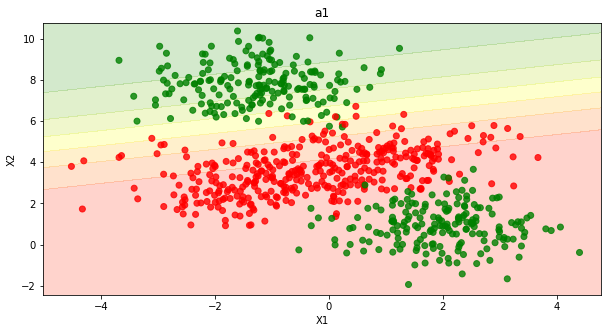

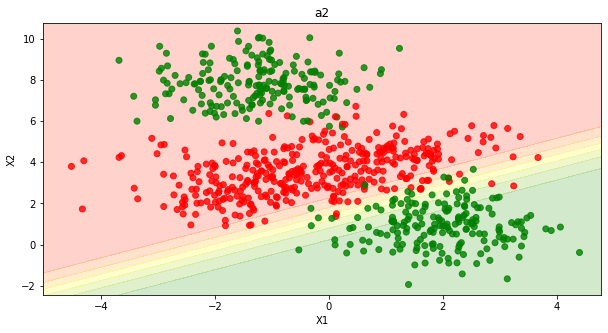

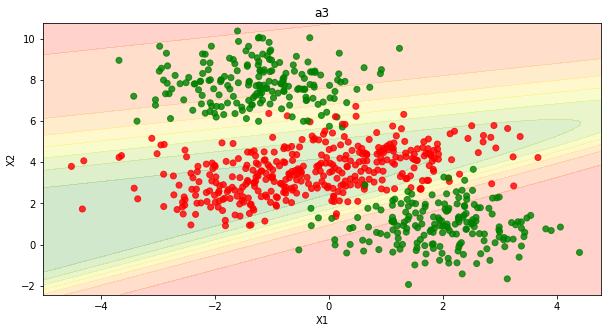

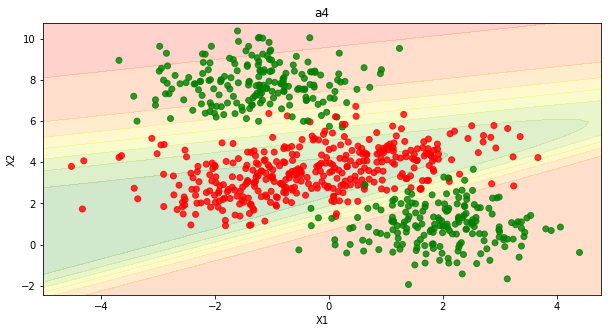

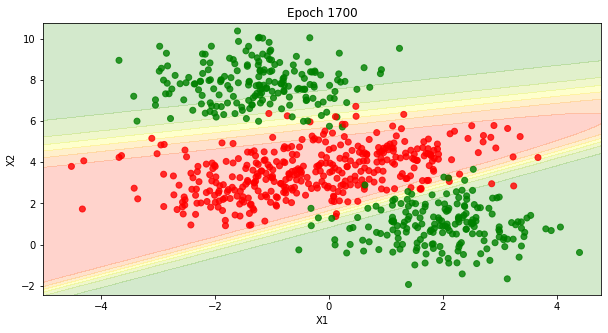

<Figure size 720x360 with 0 Axes>

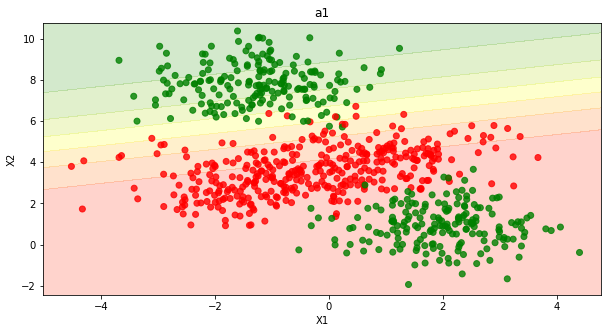

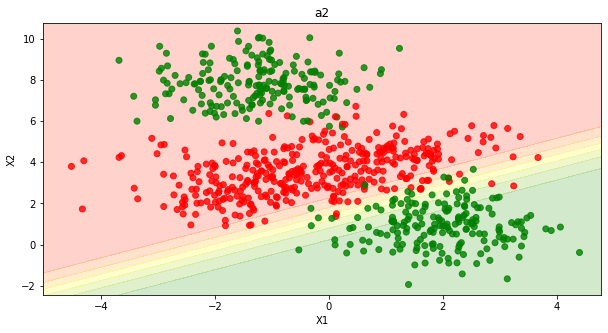

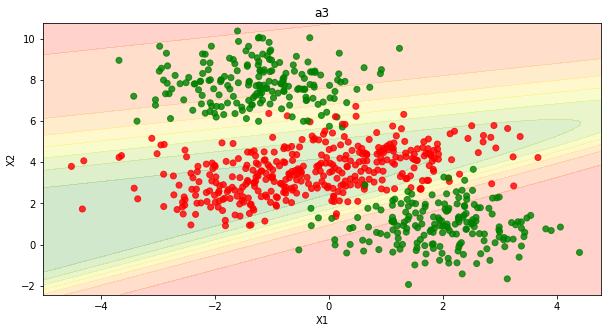

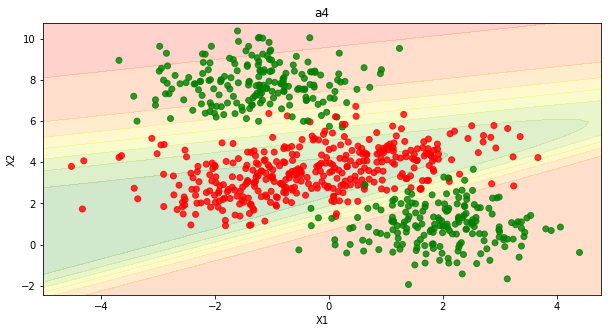

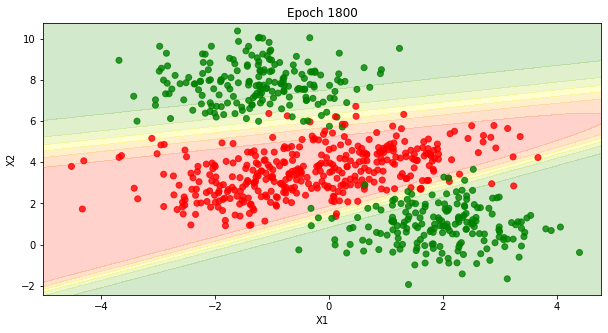

<Figure size 720x360 with 0 Axes>

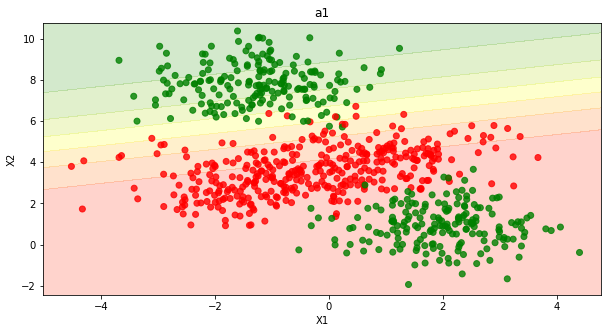

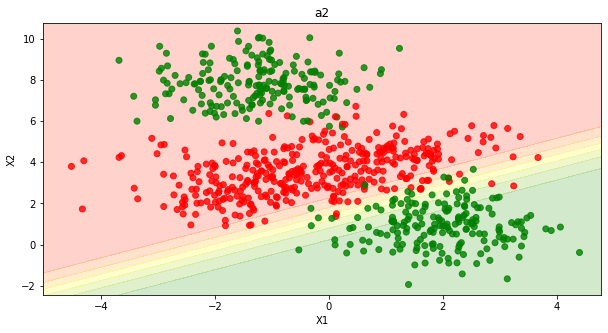

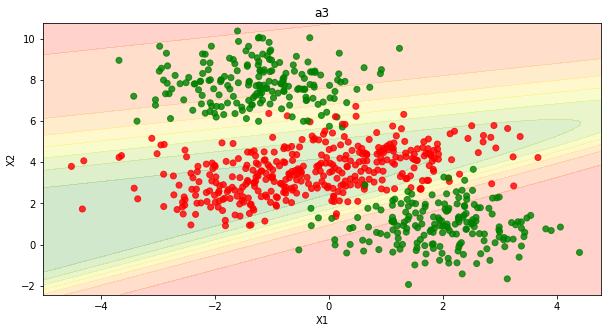

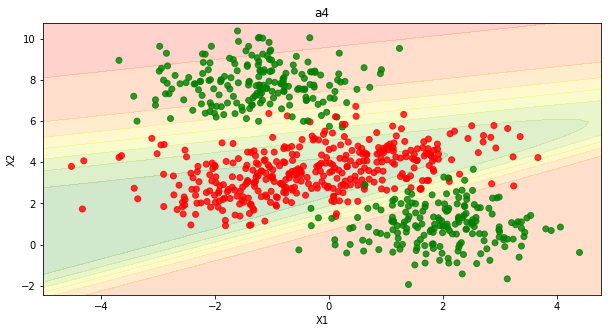

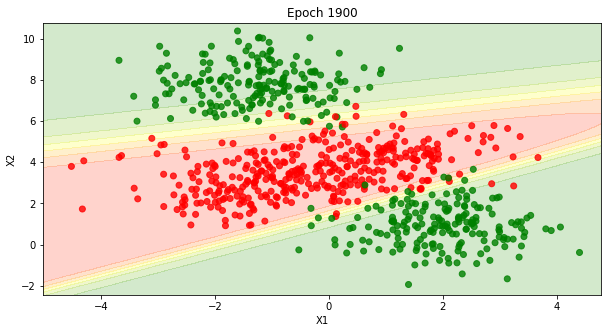

<Figure size 720x360 with 0 Axes>

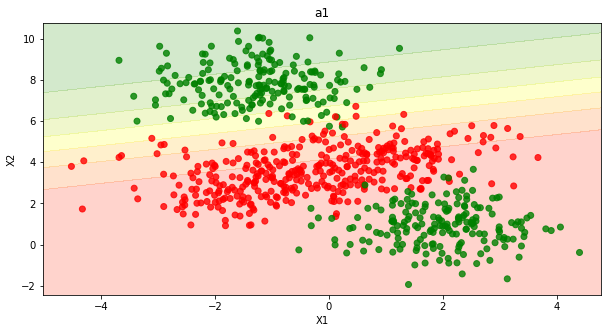

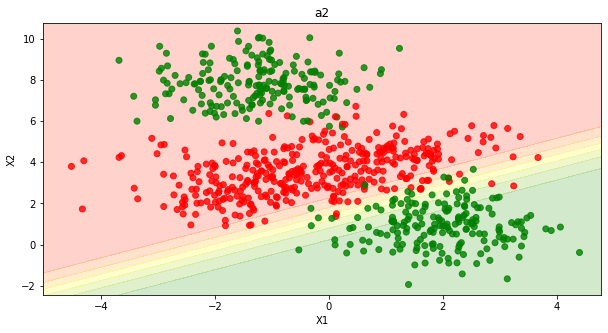

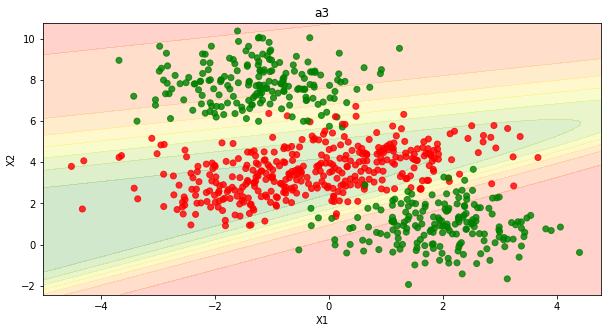

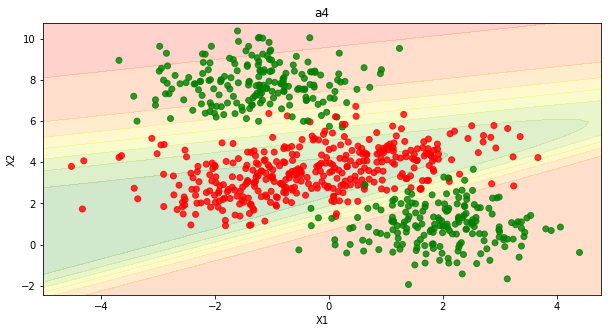

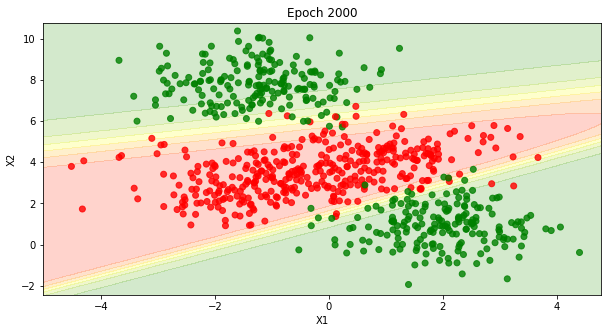

<Figure size 720x360 with 0 Axes>

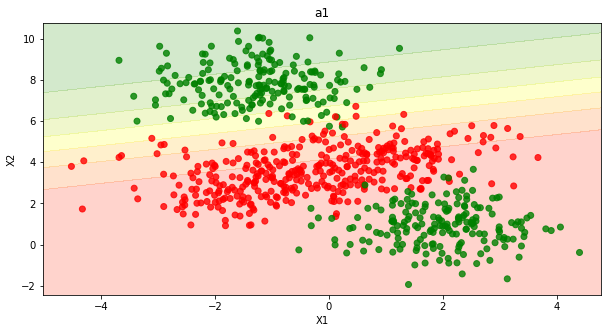

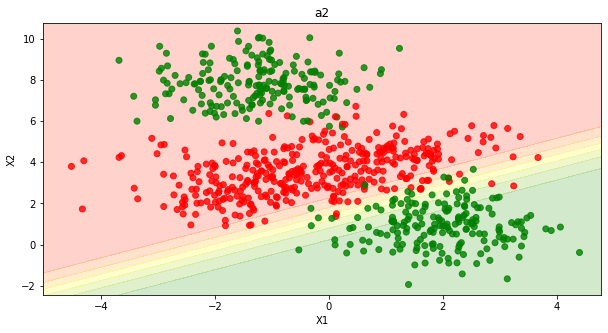

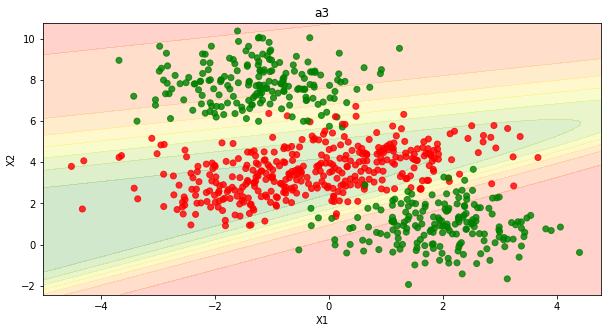

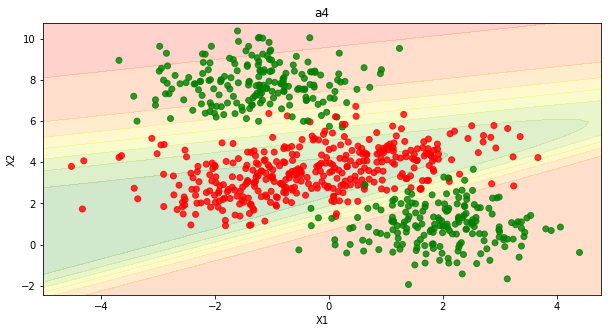

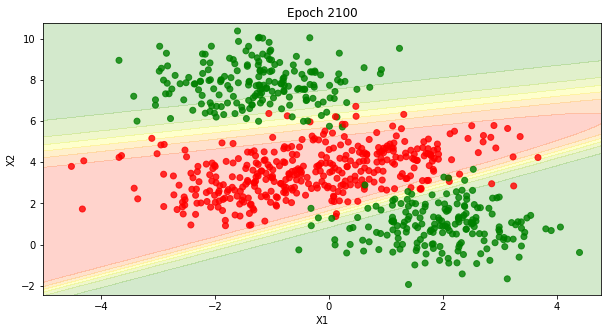

<Figure size 720x360 with 0 Axes>

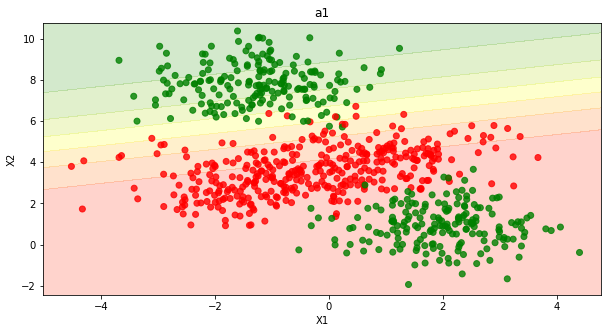

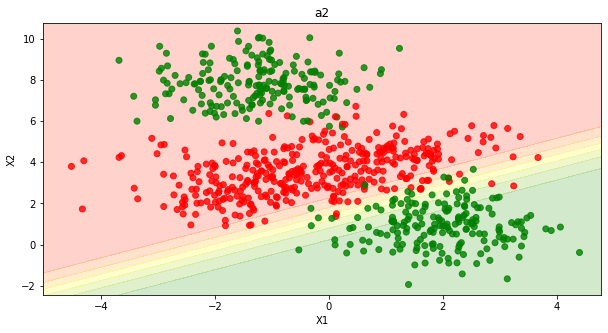

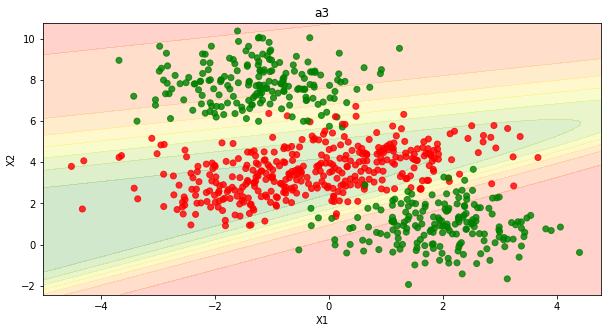

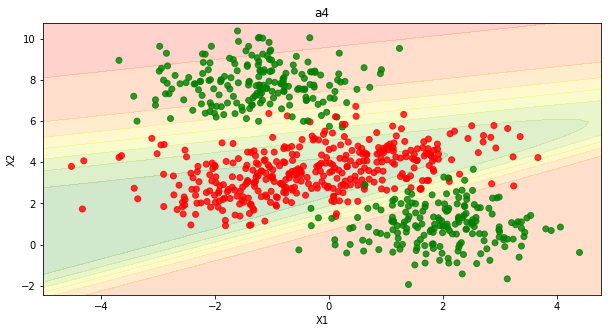

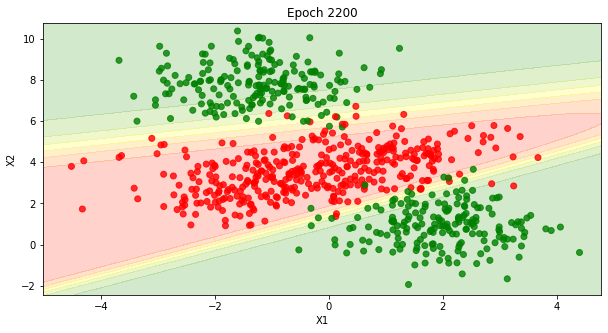

<Figure size 720x360 with 0 Axes>

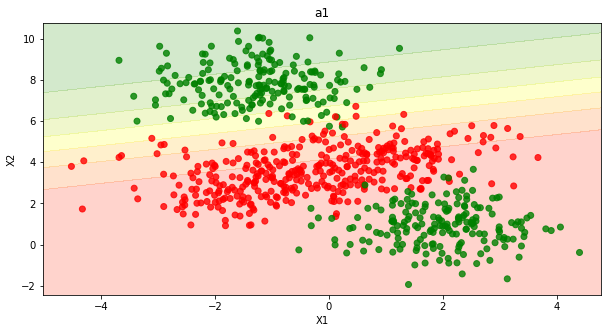

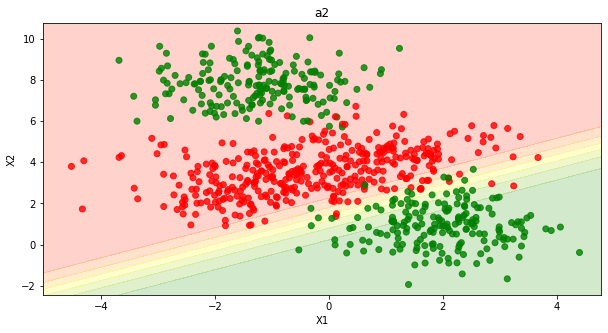

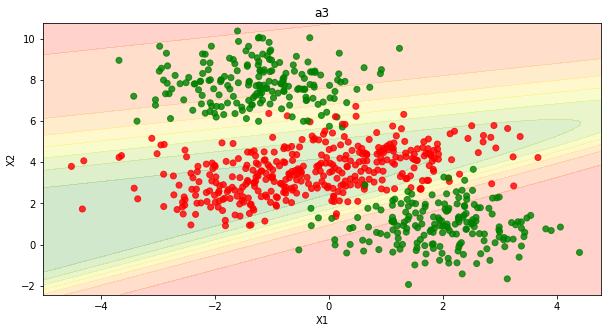

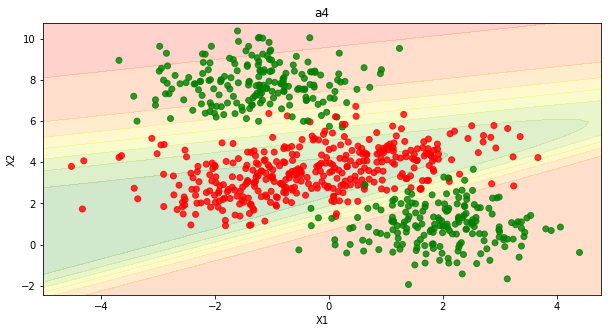

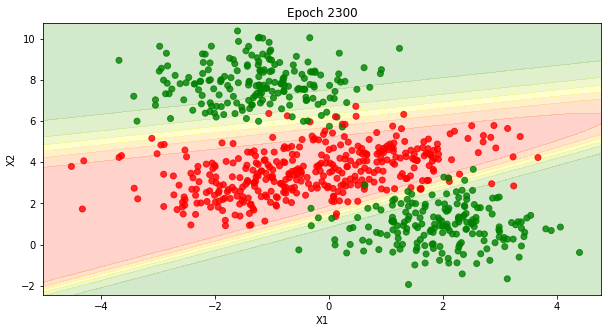

<Figure size 720x360 with 0 Axes>

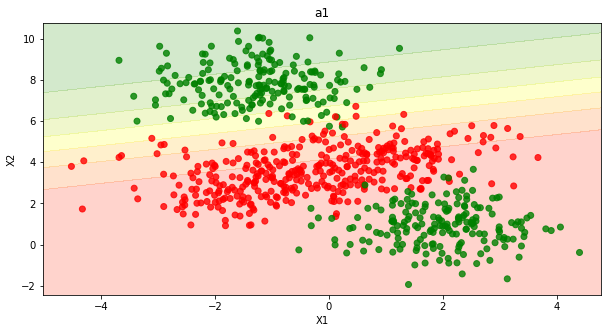

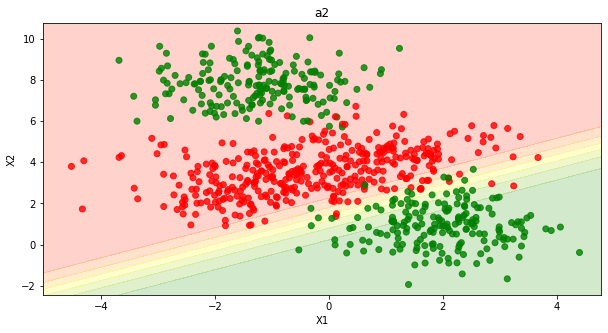

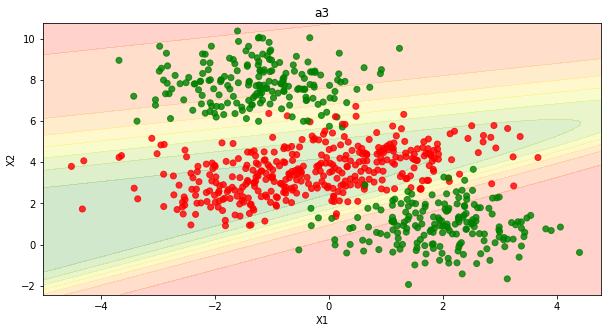

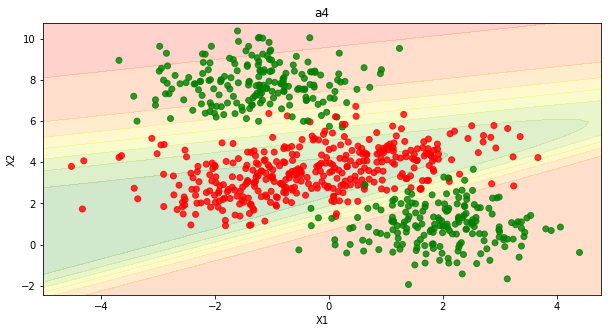

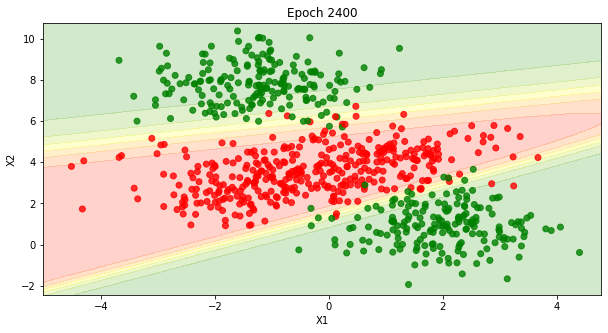

In [ ]:
imageio.mimsave("./epoch_visualization.gif", [plot_boundary_epoch(i) for i in range(0, 2500, 100)], fps=1)